# Solar Power Forecast in Portugal using Machine Learning (2020-2024)

## Library

In [3]:
import os
import re
import time
import warnings
from datetime import datetime
from io import StringIO 

# Data processing and utilities
import numpy as np
import pandas as pd
import geopandas as gpd
import requests
from tqdm import tqdm

# Model selection and validation
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from sklearn.metrics import (
    mean_absolute_error,
    mean_absolute_percentage_error,
    mean_squared_error,
    r2_score,
)

# Base and ensemble models
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

# Model inspection
from sklearn.inspection import permutation_importance

# Boosting
import lightgbm as lgb
import xgboost as xgb

# Statistical
import statsmodels.api as sm# Optimization

from scipy.stats import shapiro
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Visualization
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from tabulate import tabulate

# Optimization
from flaml import AutoML

# Global configurations
warnings.filterwarnings('ignore')
pd.set_option('future.no_silent_downcasting', True)

notebook_start = time.time()

## Data Preparation

In [6]:
df = pd.read_excel(r"C:\Users\crist\Downloads\Official_Dataset_Copy\dgeg-epc-2010-2024.xlsx", skiprows=7, engine='openpyxl')
print(f"Total: {len(df)} lines")
print(df.head(3))

df.columns = ['NUTsII_2024', 'Municipio', 'Fonte'] + [str(i) for i in range(2010, 2025)]

# Remove empty lines
df = df.dropna(how='all')

df = df[df['Fonte'].astype(str).str.contains('Fotovoltaica', case=False, na=False)]

# Remove unnecessary rows
df = df[~df['NUTsII_2024'].astype(str).str.contains('Região Autónoma dos Açores |Região Autónoma da Madeira', case=False, na=False)]
df = df[df['NUTsII_2024'] != 'Desconhecido']

# Remove extra spaces
df['Municipio'] = df['Municipio'].astype(str).str.strip()
print(f"\nMunicipalities with photovoltaic production: {len(df)}")


years = ['2020', '2021', '2022', '2023', '2024']
df_final = df[['NUTsII_2024', 'Municipio'] + years].copy()

# Converts values to float
for year in years:
    df_final[year] = df_final[year].astype(str).str.replace(',', '.')
    df_final[year] = pd.to_numeric(df_final[year], errors='coerce').fillna(0)

# Sort by power in 2024 (descending)
df_final = df_final.sort_values('2024', ascending=False).reset_index(drop=True)

print(df_final.head())
print(f"\nTotal municipalities with PV (2020–2024): {len(df_final)}")
print(f"Total installed capacity in 2024 (mainland): {df_final['2024'].sum():.1f} MW")

df_final.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\photovoltaic_capacity_municipalities_2020_2024.csv", index=False)

print(f"\nMunicipalities with more than 100 MW in 2024:")
print(df_final[df_final['2024'] > 100][['Municipio', '2024']])

Total: 716 lines
            NUTsII_2024 Municipio                Fonte     2010    2011  \
0  Oeste e Vale do Tejo  Abrantes          Fotovoltaica     0.2     0.4   
1  Oeste e Vale do Tejo  Abrantes               Térmica  1460.4  1460.4   
2  Oeste e Vale do Tejo  Abrantes     da qual renovável     0.0     0.0   

     2012    2013    2014    2015    2016    2017    2018    2019    2020  \
0     0.6     0.8     1.1     1.4     1.4     1.5     1.8     2.2     2.4   
1  1461.2  1461.2  1461.2  1460.6  1460.6  1460.6  1460.6  1460.6  1460.6   
2     0.8     0.8     0.9     0.4     0.4     0.4     0.4     0.4     0.4   

     2021   2022   2023   2024  
0     3.4    5.6    7.8    9.8  
1  1460.6  845.4  845.4  845.4  
2     0.4    0.4    0.4    0.4  

Municipalities with photovoltaic production: 278
            NUTsII_2024 Municipio  2020   2021   2022   2023   2024
0               Algarve  Alcoutim   4.1  204.1  331.9  332.0  332.2
1  Oeste e Vale do Tejo  Azambuja   2.5    3.7    5.7  

In [7]:
df= pd.read_excel(r"C:\Users\crist\Downloads\Official_Dataset_Copy\capacidade_fotovoltaica_municipios_coordenadas_2020_2024.xlsx", skiprows=2) 
print(df.head())

# GMS → Decimal
def gms_to_decimal(coord):
    if pd.isna(coord):
        return None
        
    coord = str(coord).strip()
    
    # Replace symbols for degrees, minutes, and seconds
    coord = coord.replace('º', '°').replace('′', "'").replace('″', "'").replace('”', "'").replace('“', "'").replace('´', "'")
    
    # Remove spaces and leave only numbers, ° ' and final direction
    coord = coord.upper()
    
    # Extract direction (N/S/E/W) (at the end or at the beginning)
    direction = 1
    if coord.startswith(('S', 'W')):
        direction = -1
        coord = coord[1:].strip()
    elif coord.startswith(('N', 'E')):
        coord = coord[1:].strip()
    if coord.endswith(('S', 'W')):
        direction = -1
        coord = coord[:-1].strip()
    elif coord.endswith(('N', 'E')):
        coord = coord[:-1].strip()
    
    # extract degrees, minutes, seconds
    match = re.search(r'(\d+)°\s*(\d+)\'\s*([\d.]+)', coord)
    if not match:
        match = re.search(r'(\d+)°\s*(\d+)', coord)
        if not match:
            print(f"Unrecognized format: {coord}")
            return None
        degrees, minutes, seconds = int(match.group(1)), int(match.group(2)), 0
    else:
        degrees = int(match.group(1))
        minutes = int(match.group(2))
        seconds = float(match.group(3))
    
    decimal = degrees + minutes/60 + seconds/3600
    return round(decimal * direction, 6)


df['Latitude_Decimal']  = df['Latitute_GMS'].apply(gms_to_decimal)
df['Longitude_Decimal'] = df['Longitute_GMS'].apply(gms_to_decimal)

print(df[['NUTsII_2024','Municipio', 'Latitude_Decimal', 'Longitude_Decimal']].head(15))


failures = df[df['Latitude_Decimal'].isna()]
if len(failures) > 0:
    print(f"\nMunicipalities with conversion errors: {len(failures)}")
    print(failures[['Municipio', 'Latitude', 'Longitude']])

coords_list = [
    f"({row['Longitude_Decimal']:.2f},{row['Latitude_Decimal']:.2f})"
    for _, row in df.iterrows()
    if pd.notna(row['Latitude_Decimal']) and pd.notna(row['Longitude_Decimal'])
]

print("\nAll 278 coordinates in decimal degrees:")
print("All:", coords_list)

# Export
df.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_decimal_coordinates.csv", index=False)

  NUTsII_2024             Municipio    Latitute_GMS  Longitute_GMS
0    Alentejo              Monforte   N 39° 2′ 58''  W 7° 26′ 39''
1    Alentejo                 Moura   N 38° 7′ 53''  W 7° 17′ 48''
2    Alentejo               Ourique  N 37° 41′ 29''  W 8° 18′ 37''
3    Alentejo  Ferreira do Alentejo   N 38° 5′ 57''  W 8° 10′ 16''
4    Alentejo                 Évora  N 38° 33′ 59''  W 7° 53′ 40''
   NUTsII_2024             Municipio  Latitude_Decimal  Longitude_Decimal
0     Alentejo              Monforte         39.049444          -7.444167
1     Alentejo                 Moura         38.131389          -7.296667
2     Alentejo               Ourique         37.691389          -8.310278
3     Alentejo  Ferreira do Alentejo         38.099167          -8.171111
4     Alentejo                 Évora         38.566389          -7.894444
5     Alentejo                 Serpa         37.951944          -7.475278
6     Alentejo                 Sines         37.953333          -8.871111
7     

In [8]:
coords = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_decimal_coordinates.csv")
capacity = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\photovoltaic_capacity_municipalities_2020_2024.csv")
print(f"Coordinates: {len(coords)} municipalities")
print(f"Capacity: {len(capacity)} municipalities")

# Clean and merge
coords['Municipio'] = coords['Municipio'].astype(str).str.strip()
capacity['Municipio'] = capacity['Municipio'].astype(str).str.strip()

df_final = capacity.merge(
    coords[['Municipio', 'Latitude_Decimal', 'Longitude_Decimal']],
    on='Municipio',
    how='left'  
)

error = df_final[df_final['Latitude_Decimal'].isna()]
if len(error) > 0:
    print("\nMunicipalities without coordinates:")
    print(error['Municipio'].tolist())
else:
    print("All coordinates have been found")

# Export
df_final.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_coordinates_capacity.csv", index=False)
print(f"\nDataset with {len(df_final)} municipalities")
print(f"   → Total power 2024:: {df_final['2024'].sum():.0f} MW")

Coordinates: 278 municipalities
Capacity: 278 municipalities
All coordinates have been found

Dataset with 278 municipalities
   → Total power 2024:: 5640 MW


In [9]:
nasa_folder= r"C:\Users\crist\Downloads\Official_Dataset_Copy\NASA_municipalities_2020_2024"
os.makedirs(nasa_folder, exist_ok=True)

df = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_coordinates_capacity.csv")
df['Municipio'] = df['Municipio'].astype(str).str.strip()

print(f"Total number of municipalities: {len(df)}")
print(f"Total power 2024: {df['2024'].sum():.0f} MW")

start_date = "20200101"
end_date   = "20241231"

def download_nasa_municipality(municipality, lat, lon):
    name = "".join(c for c in municipality if c.isalnum() or c in " _-_.")[:50]
    filename = os.path.join(nasa_folder, f"{name}_{lat}_{lon}.csv")
    
    # If it already exists
    if os.path.exists(filename) and os.path.getsize(filename) > 50_000:
        return True
    
    url = "https://power.larc.nasa.gov/api/temporal/hourly/point"
    parameters = "ALLSKY_SFC_SW_DWN,CLRSKY_SFC_SW_DWN,ALLSKY_SFC_SW_DIFF,ALLSKY_SFC_SW_DNI,T2M,RH2M,PRECTOTCORR,PS,WS10M"  
    
    params = {
        "start": start_date,
        "end": end_date,
        "latitude": round(lat, 6),
        "longitude": round(lon, 6),
        "community": "RE",
        "parameters": parameters,
        "format": "CSV",
        "time-standard": "UTC",
        "header": "true"
    }
    
    for attempt in range(5):
        try:
            r = requests.get(url, params=params, timeout=90)
            if r.status_code == 200:
                text = r.text.strip()
                if "YEAR" not in text:
                    raise ValueError("No data")
                
                with open(filename, "w", encoding="utf-8", newline="\n") as f:
                    f.write(text)
                return True
            else:
                raise ValueError(f"HTTP {r.status_code}")
        except Exception as e:
            if attempt == 4:
                print(f"  Error → {municipality} ({lat}, {lon}) | {e}")
                return False
            time.sleep(8 * (attempt + 1))
    
    return False

# Loop
successes = 0
failures = []

print(f"\n Startet at {datetime.now().strftime('%H:%M')}...")

for idx, row in tqdm(df.iterrows(), total=len(df), desc="Municípios"):
    municipality = row['Municipio']
    lat = row['Latitude_Decimal']
    lon = row['Longitude_Decimal']
    
    if pd.isna(lat) or pd.isna(lon):
        print(f" No coordinates → {municipality}")
        failures.append(municipality)
        continue
    
    if download_nasa_municipality(municipality, lat, lon):
        successes += 1
    else:
        failures.append(municipality)
    
    time.sleep(0.7)  

# Export
print(f"Successes: {successes}/{len(df)} municipalities")
print(f"Failures: {len(failures)}")
if failures:
    print("Failed:", failures[:20], "..." if len(failures)>20 else "")
print(f"Files saved in:\n {nasa_folder}")
print(f"Download finished at {datetime.now().strftime('%H:%M:%S')}")

Total number of municipalities: 278
Total power 2024: 5640 MW

 Startet at 01:33...


Municípios: 100%|██████████| 278/278 [30:27<00:00,  6.58s/it] 

Successes: 278/278 municipalities
Failures: 0
Files saved in:
 C:\Users\crist\Downloads\Official_Dataset_Copy\NASA_municipalities_2020_2024
Download finished at 02:03:50


In [10]:
original_folder = r"C:\Users\crist\Downloads\Official_Dataset_Copy\NASA_municipalities_2020_2024"
csv_folder = r"C:\Users\crist\Downloads\Official_Dataset_Copy\NASA_municipalities_2020_2024_cleaned_version"
os.makedirs(csv_folder, exist_ok=True)

extensions = ('.csv', '.xlsx')
folders = [f for f in os.listdir(original_folder) if f.lower().endswith(extensions)]
print(f"Found {len(folders)} files")

start = datetime.now()

# Columns that come as hourly accumulated energy (Wh/m2) in NASA POWER
SOLAR_WH_COLS = [
    "ALLSKY_SFC_SW_DWN",
    "CLRSKY_SFC_SW_DWN",
    "ALLSKY_SFC_SW_DIFF",
    "ALLSKY_SFC_SW_DNI",
]

def analyze_nasa(way):
    with open(way, 'r', encoding='utf-8', errors='ignore') as f:
        lines = f.readlines()
    try:
        end_header = next(i for i, lines in enumerate(lines) if "-END HEADER-" in lines)
    except:
        print(f" Header not found in {os.path.basename(way)}")
        return None
    
    lines_with_data = lines[end_header + 1:]
    
    # Read as DataFrame
    df_data = pd.read_csv(StringIO(''.join(lines_with_data)))
    
    # Create correct datetime
    df_data['datetime'] = pd.to_datetime({
        'year': df_data['YEAR'],
        'month': df_data['MO'],
        'day': df_data['DY'],
        'hour': df_data['HR']
    })
    df_data.drop(['YEAR', 'MO', 'DY', 'HR'], axis=1, inplace=True)
    df_data = df_data.set_index('datetime')

    df_data = df_data.replace(-999, pd.NA)
    df_data = df_data.infer_objects(copy=False)  #  object to float/int 

    #Wh/m2 (hourly) -> W/m2 (hourly mean power) 
    convert = {}
    for col in SOLAR_WH_COLS:
        if col in df_data.columns:
            df_data[col] = pd.to_numeric(df_data[col], errors="coerce") / 1.0
            convert[col] = f"{col}"

    if convert:
        df_data = df_data.rename(columns=convert)

    return df_data

# Loop
cleaned = 0
for folder in tqdm(folders, desc="Cleaning"):
    original_way = os.path.join(original_folder, folder)
    base_name = os.path.splitext(folder)[0]
    csv_way = os.path.join(csv_folder, f"{base_name}.csv")
    
    df = analyze_nasa(original_way)
    if df is None or df.empty:
        continue
    
    # Export
    df.to_csv(csv_way, index=True, date_format='%Y-%m-%d %H:%M:%S')
    cleaned += 1


end = datetime.now()
print(f"Sucessfully cleaned: {cleaned}/{len(folder)} files")
print(f"Finished at {end.strftime('%H:%M:%S')} (duration: {str(end - start).split('.')[0]})")

Found 278 files


Cleaning: 100%|██████████| 278/278 [02:20<00:00,  1.98it/s]

Sucessfully cleaned: 278/30 files
Finished at 02:06:10 (duration: 0:02:20)


In [11]:
df = pd.read_excel(r"C:\Users\crist\Downloads\Official_Dataset_Copy\Repartição da Produção_20200101_20241231.xlsx", skiprows=2)
df = (df[['Data e Hora', 'Solar']].rename(columns={'Data e Hora': 'datetime'}))

df.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\REN_solar_production_2020_2024.csv", index=False)
print("Done!")

Done!


In [12]:
ren = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\REN_solar_production_2020_2024.csv")
ren['datetime'] = pd.to_datetime(ren['datetime'])

# 15min conversion → hourly 
ren_1h = (
    ren.set_index('datetime')
       .resample('1h')['Solar']  # '1H' = hourly
       .mean()                   # Average of 15-minute values → Average MW per hour
       .round(3)
       .reset_index()
       .rename(columns={'Solar': 'production_mw'})
)

print(f"Conversion done → {len(ren_1h):,} rows")
print(f"From: {ren_1h['datetime'].min()} → {ren_1h['datetime'].max()}")

# check
print("\nChecking (average MW per hour):")
print("01-Jan-2020 07:00 →", 
      ren_1h[ren_1h['datetime'] == '2020-01-01 07:00:00']['production_mw'].iloc[0] 
      if not ren_1h[ren_1h['datetime'] == '2020-01-01 07:00:00'].empty else "No data", 
      "MW ← winter hour")
print("15-Jun-2021 12:00 →", 
      ren_1h[ren_1h['datetime'] == '2021-06-15 12:00:00']['production_mw'].iloc[0] 
      if not ren_1h[ren_1h['datetime'] == '2021-06-15 12:00:00'].empty else "No data", 
      "MW ← summer hour")

print(f"\nAverage hourly solar power 2020–2024: {ren_1h['production_mw'].mean():,.1f} MW")

# Export
ren_1h.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\ren_2020_2024.csv", index=False, date_format='%m/%d/%Y %H:%M')
print(f"Total solar energy 2020–2024: {ren_1h['production_mw'].sum():,.0f} MW")

Conversion done → 43,848 rows
From: 2020-01-01 00:00:00 → 2024-12-31 23:00:00

Checking (average MW per hour):
01-Jan-2020 07:00 → 0.55 MW ← winter hour
15-Jun-2021 12:00 → 618.125 MW ← summer hour

Average hourly solar power 2020–2024: 319.7 MW
Total solar energy 2020–2024: 14,017,406 MW


In [13]:
nasa_folder = r"C:\Users\crist\Downloads\Official_Dataset_Copy\NASA_municipalities_2020_2024_cleaned_version"

years = [2020, 2021, 2022, 2023, 2024]

# REN installed capacity  
cap_ren = {
    2020: 879,
    2021: 1387,
    2022: 1891,
    2023: 2641,
    2024: 3872
}

# Variable renaming 
rename_var = {
    'ALLSKY_SFC_SW_DWN': 'GHI',           # Global Horizontal Irradiance (all sky)
    'CLRSKY_SFC_SW_DWN': 'ClearSky_GHI',  # Global Horizontal Irradiance (clear sky)
    'ALLSKY_SFC_SW_DIFF': 'DHI',          # Diffuse Horizontal Irradiance
    'ALLSKY_SFC_SW_DNI': 'DNI',           # Direct Normal Irradiance
    'T2M': 'Temperature',                 # Temperature at 2m
    'RH2M': 'Relative_Humidity',          # Relative Humidity at 2m
    'WS10M': 'Wind_Speed',                # Wind speed at 10m
    'PS': 'Pressure',                     # Surface pressure
    'PRECTOTCORR': 'Precipitation'        # Precipitation
}

def load_and_clean_municipal_nasa(filepath):
    try:
        df = pd.read_csv(filepath)
        df['datetime'] = pd.to_datetime(df['datetime'])
        df = df.set_index('datetime')
        df = df.rename(columns=rename_var)
        return df[list(rename_var.values())] 
    except Exception as e:
        print(f"Error loading {filepath}: {e}")
        return None

# Load DGEG municipal capacity
cap = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_coordinates_capacity.csv")
cap['Municipio'] = cap['Municipio'].astype(str).str.strip()

# Calculate total DGEG capacity per year (adjustment factor)
cap_dgeg_total = {}
for year in years:
    total = cap[str(year)].sum()
    cap_dgeg_total[year] = total
    print(f"DGEG total capacity {year}: {total:.0f} MW")

# Calculate annual adjustment factor: REN_capacity / DGEG_total_capacity
# scales municipal weights to represent only the fraction connected to the Public Network
adjustment_factors = {}
for year in years:
    factor = cap_ren[year] / cap_dgeg_total[year] if cap_dgeg_total[year] > 0 else 1.0
    adjustment_factors[year] = factor
    print(f"Adjustment factor {year}: {factor:.4f} (REN {cap_ren[year]} MW / DGEG {cap_dgeg_total[year]:.0f} MW)")

# Weighted aggregation loop
weighted_dfs = []

for year in years:
    print(f"\nProcessing year {year}...")
    
    # Municipal capacity for the year
    cap_year = cap[['Municipio', str(year)]].copy()
    cap_year = cap_year[cap_year[str(year)] > 0]  # Exclude zero capacity
    
    # Apply adjustment factor to reflect grid-connected fraction
    adjustment = adjustment_factors[year]
    cap_year['adjusted_capacity'] = cap_year[str(year)] * adjustment
    
    total_adjusted_mw = cap_year['adjusted_capacity'].sum()
    print(f"  {len(cap_year)} municipalities with capacity")
    print(f"  Adjusted total capacity: {total_adjusted_mw:.0f} MW (matches REN {cap_ren[year]} MW)")
    
    df_year_weighted = None
    
    for _, row in tqdm(cap_year.iterrows(), total=len(cap_year), desc=f"Weighting {year}"):
        municipality = row['Municipio']
        weight = row['adjusted_capacity'] / total_adjusted_mw  # Weight based on adjusted capacity
        
        # Find corresponding NASA file (
        possibles = [f for f in os.listdir(nasa_folder) 
                     if municipality.replace(" ", "").lower() in f.replace(" ", "").lower()]
        
        if not possibles:
            continue  # Skip if no file found
        
        filepath = os.path.join(nasa_folder, possibles[0])
        df_mun = load_and_clean_municipal_nasa(filepath)
        
        if df_mun is None:
            continue
        
        # Filter to current year only
        df_mun_year = df_mun[df_mun.index.year == year]
        
        # Apply weight
        df_mun_weighted = df_mun_year * weight
        
        # Accumulate
        if df_year_weighted is None:
            df_year_weighted = df_mun_weighted
        else:
            df_year_weighted = df_year_weighted.add(df_mun_weighted, fill_value=0)
    
    if df_year_weighted is not None:
        weighted_dfs.append(df_year_weighted)

# Concatenate all years
national_result = pd.concat(weighted_dfs)
national_result = national_result.sort_index()

# Final check
print(f"\nWeighted national result created:")
print(f"  Total rows: {len(national_result)}")
print(f"  Date range: {national_result.index.min()} to {national_result.index.max()}")

# Save results
national_result.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\weighted_national_result_2020_2024.csv")

DGEG total capacity 2020: 1083 MW
DGEG total capacity 2021: 1800 MW
DGEG total capacity 2022: 2659 MW
DGEG total capacity 2023: 3868 MW
DGEG total capacity 2024: 5640 MW
Adjustment factor 2020: 0.8116 (REN 879 MW / DGEG 1083 MW)
Adjustment factor 2021: 0.7705 (REN 1387 MW / DGEG 1800 MW)
Adjustment factor 2022: 0.7111 (REN 1891 MW / DGEG 2659 MW)
Adjustment factor 2023: 0.6827 (REN 2641 MW / DGEG 3868 MW)
Adjustment factor 2024: 0.6865 (REN 3872 MW / DGEG 5640 MW)

Processing year 2020...
  275 municipalities with capacity
  Adjusted total capacity: 879 MW (matches REN 879 MW)


Weighting 2020: 100%|██████████| 275/275 [00:19<00:00, 14.06it/s]



Processing year 2021...
  277 municipalities with capacity
  Adjusted total capacity: 1387 MW (matches REN 1387 MW)


Weighting 2021: 100%|██████████| 277/277 [00:17<00:00, 16.18it/s]



Processing year 2022...
  278 municipalities with capacity
  Adjusted total capacity: 1891 MW (matches REN 1891 MW)


Weighting 2022: 100%|██████████| 278/278 [00:17<00:00, 16.14it/s]



Processing year 2023...
  278 municipalities with capacity
  Adjusted total capacity: 2641 MW (matches REN 2641 MW)


Weighting 2023: 100%|██████████| 278/278 [00:17<00:00, 16.28it/s]



Processing year 2024...
  278 municipalities with capacity
  Adjusted total capacity: 3872 MW (matches REN 3872 MW)


Weighting 2024: 100%|██████████| 278/278 [00:16<00:00, 16.48it/s]



Weighted national result created:
  Total rows: 43848
  Date range: 2020-01-01 00:00:00 to 2024-12-31 23:00:00


In [14]:
ren = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\ren_2020_2024.csv", parse_dates=['datetime'])
ren = ren.set_index('datetime')
print("REN loaded - rows:", len(ren), "| columns:", ren.columns.tolist())

# Load weighted NASA (adjusted with REN fraction)
weighted_national = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\weighted_national_result_2020_2024.csv", index_col=0, parse_dates=True) 
print("Weighted NASA loaded - rows:", len(weighted_national), "| columns:", weighted_national.columns.tolist())

# Join REN + Weighted NASA 
df = ren.join(weighted_national, how='inner')
df = df.sort_index()
df = df.ffill(limit=3).bfill(limit=3)
print("\nJoin complete - final rows:", len(df))
print("Date range:", df.index.min(), "to", df.index.max())

# Add temporal columns
df['month'] = df.index.month
df['hour'] = df.index.hour
df['year'] = df.index.year
df['date'] = df.index.date

df.to_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\final_dataset_2020_2024.csv")
print(df.columns.tolist())

REN loaded - rows: 43848 | columns: ['production_mw']
Weighted NASA loaded - rows: 43848 | columns: ['GHI', 'ClearSky_GHI', 'DHI', 'DNI', 'Temperature', 'Relative_Humidity', 'Wind_Speed', 'Pressure', 'Precipitation']

Join complete - final rows: 43848
Date range: 2020-01-01 00:00:00 to 2024-12-31 23:00:00
['production_mw', 'GHI', 'ClearSky_GHI', 'DHI', 'DNI', 'Temperature', 'Relative_Humidity', 'Wind_Speed', 'Pressure', 'Precipitation', 'month', 'hour', 'year', 'date']


In [15]:
continente =  gpd.read_file(r"C:\Users\crist\Downloads\Official_Dataset_Copy\CAOP_Continente_2024_1-gpkg\Continente_CAOP2024_1.gpkg", layer='cont_nuts1')

# Check the CRS (coordinate reference system)
print(continente.crs) 

EPSG:3763


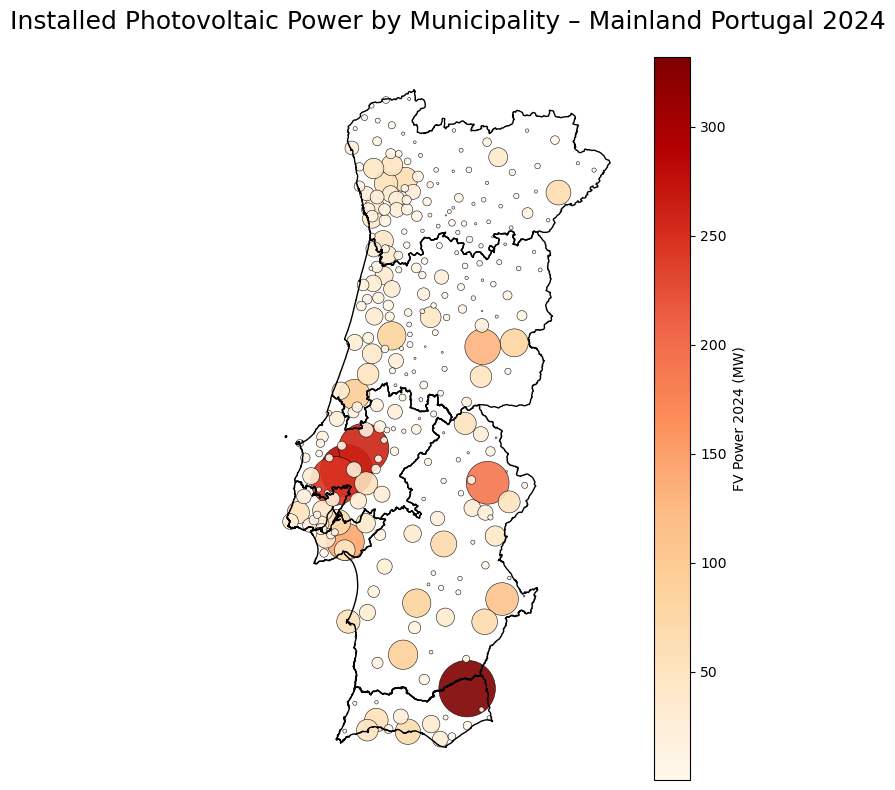

In [16]:
df = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_coordinates_capacity.csv")
gdf_portugal = gpd.read_file(r"C:\Users\crist\Downloads\Official_Dataset_Copy\CAOP_Continente_2024_1-gpkg\Continente_CAOP2024_1.gpkg", layer='cont_nuts2')
gdf_portugal = gdf_portugal.to_crs("EPSG:4326")

gdf_points = gpd.GeoDataFrame(df,
    geometry=gpd.points_from_xy(df.Longitude_Decimal, df.Latitude_Decimal),
    crs="EPSG:4326")

fig, ax = plt.subplots(1, 1, figsize=(6,8))
gdf_portugal.boundary.plot(ax=ax, color='black', linewidth=1)
gdf_points.plot(
    ax=ax,
    markersize=gdf_points['2024'] * 5,
    column='2024',
    cmap='OrRd',
    alpha=0.9,
    edgecolor='black',
    linewidth=0.4,
    legend=True,
    legend_kwds={'label': "FV Power 2024 (MW)", 'orientation': "vertical"}
)

ax.set_title("Installed Photovoltaic Power by Municipality – Mainland Portugal 2024", fontsize=18, pad=20)
ax.set_axis_off()
plt.tight_layout()
plt.savefig(r"C:\Users\crist\Downloads\Official_Dataset_Copy\photovoltaic_power_map_2024.png", dpi=300, bbox_inches='tight')
plt.show()

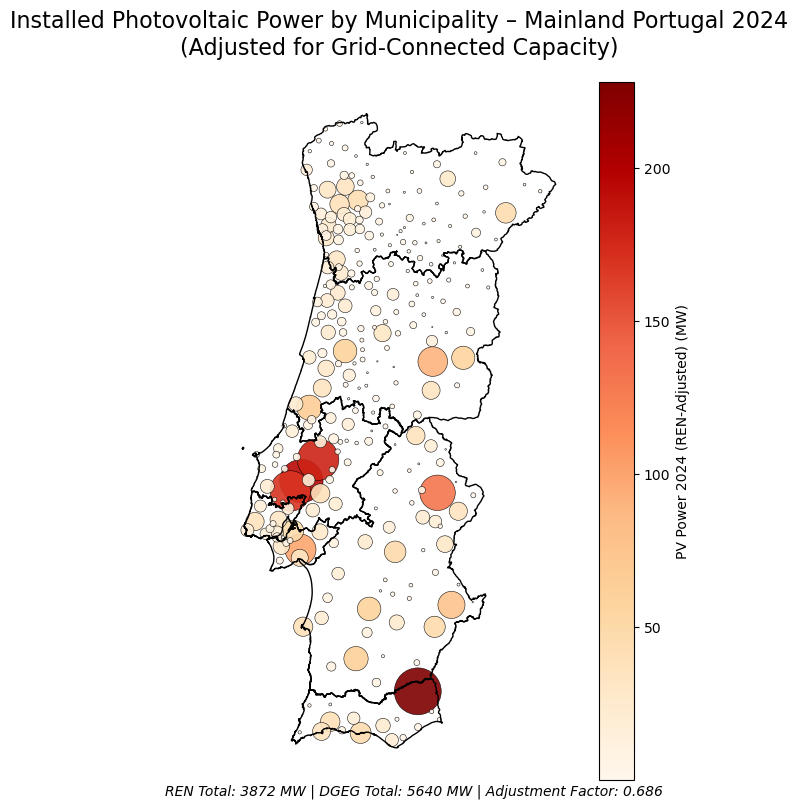

In [17]:
df = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\municipalities_coordinates_capacity.csv")
df['Municipio'] = df['Municipio'].astype(str).str.strip() 

df['capacity_2024_adjusted'] = df['2024'] * adjustment_factors[2024]

gdf_points_adjusted = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.Longitude_Decimal, df.Latitude_Decimal),
    crs="EPSG:4326"
)

fig, ax = plt.subplots(1, 1, figsize=(6, 8))
gdf_portugal.boundary.plot(ax=ax, color='black', linewidth=1)

# Plot municipalities based on ADJUSTED capacity
scatter_plot = gdf_points_adjusted.plot(
    ax=ax,
    markersize=gdf_points_adjusted['capacity_2024_adjusted'] * 5, 
    column='capacity_2024_adjusted',  
    cmap='OrRd',  
    alpha=0.9, 
    edgecolor='black', 
    linewidth=0.4,
    legend=True,  
    legend_kwds={'label': "PV Power 2024 (REN-Adjusted) (MW)", 'orientation': "vertical", }
)

ax.set_title("Installed Photovoltaic Power by Municipality – Mainland Portugal 2024\n" 
             "(Adjusted for Grid-Connected Capacity)", fontsize=16, pad=20)
ax.set_axis_off()  

total_adjusted = df['capacity_2024_adjusted'].sum()
total_dgeg = df['2024'].sum()
plt.figtext(0.5, 0.0, f"REN Total: {cap_ren[2024]:.0f} MW | DGEG Total: {total_dgeg:.0f} MW | Adjustment Factor: {adjustment_factors[2024]:.3f}",
    ha='center',  # Center alignment
    fontsize=10,
    style='italic'
)

plt.tight_layout()
plt.savefig(r"C:\Users\crist\Downloads\Official_Dataset_Copy\photovoltaic_power_map_2024_adjusted.png", dpi=300, bbox_inches='tight')
plt.show()

### Exploratory Data Analysis (before splitting)

In [21]:
df = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\final_dataset_2020_2024.csv")

In [22]:
df.head()

,datetime,production_mw,GHI,ClearSky_GHI,DHI,DNI,Temperature,Relative_Humidity,Wind_Speed,Pressure,Precipitation,month,hour,year,date
0,2020-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,6.592813,92.757879,2.392449,100.929071,0.001495,1,0,2020,2020-01-01
1,2020-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,6.098491,94.587969,2.518893,100.892619,0.018419,1,1,2020,2020-01-01
2,2020-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0,5.613244,96.010325,2.640217,100.888476,0.021146,1,2,2020,2020-01-01
3,2020-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0,5.283121,96.152389,2.715604,100.880331,0.022136,1,3,2020,2020-01-01
4,2020-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,5.017412,96.091336,2.822193,100.861270,0.011951,1,4,2020,2020-01-01


In [23]:
df.shape

(43848, 15)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   datetime           43848 non-null  object 
 1   production_mw      43848 non-null  float64
 2   GHI                43848 non-null  float64
 3   ClearSky_GHI       43848 non-null  float64
 4   DHI                43848 non-null  float64
 5   DNI                43848 non-null  float64
 6   Temperature        43848 non-null  float64
 7   Relative_Humidity  43848 non-null  float64
 8   Wind_Speed         43848 non-null  float64
 9   Pressure           43848 non-null  float64
 10  Precipitation      43848 non-null  float64
 11  month              43848 non-null  int64  
 12  hour               43848 non-null  int64  
 13  year               43848 non-null  int64  
 14  date               43848 non-null  object 
dtypes: float64(10), int64(3), object(2)
memory usage: 5.0+ MB


In [25]:
df.isna().sum()

datetime             0
production_mw        0
GHI                  0
ClearSky_GHI         0
DHI                  0
DNI                  0
Temperature          0
Relative_Humidity    0
Wind_Speed           0
Pressure             0
Precipitation        0
month                0
hour                 0
year                 0
date                 0
dtype: int64

In [26]:
df.duplicated().sum()

0

In [27]:
df.dtypes

datetime              object
production_mw        float64
GHI                  float64
ClearSky_GHI         float64
DHI                  float64
DNI                  float64
Temperature          float64
Relative_Humidity    float64
Wind_Speed           float64
Pressure             float64
Precipitation        float64
month                  int64
hour                   int64
year                   int64
date                  object
dtype: object

### Split + feature engineering

In [30]:
df = pd.read_csv(r"C:\Users\crist\Downloads\Official_Dataset_Copy\final_dataset_2020_2024.csv")
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')
df = df.sort_index()
total_rows = len(df)


train_end = '2023-12-31 23:00:00'      # End of training period

# Create boolean masks
train_mask = df.index <= train_end
test_mask  = df.index > train_end

# split
df_train = df.loc[train_mask].copy()
df_test = df.loc[test_mask].copy()

print("\nTemporal Split Summary:")
print(f" Train: {df_train.index.min()} to {df_train.index.max()} ({len(df_train)} hours)")
print(f" Test:  {df_test.index.min()} to {df_test.index.max()} ({len(df_test)} hours)")

def interpolate_capacity(df, cap_ren):

    df = df.copy()
    
    for year in df.index.year.unique():
        if year in cap_ren:
            if year == min(cap_ren.keys()):
                capacity_start = cap_ren[year]
            else:
                capacity_start = cap_ren[year - 1]
            
            capacity_end = cap_ren[year]
            
            days_in_year = 365 if not pd.Timestamp(year=year, month=12, day=31).is_leap_year else 366
            
            year_mask = df.index.year == year
            
            day_of_year = df[year_mask].index.dayofyear
            fraction_of_year = (day_of_year - 1) / (days_in_year - 1)
            
            # Interpolate
            df.loc[year_mask, 'capacity_mw_ren'] = (
                capacity_start + (capacity_end - capacity_start) * fraction_of_year
            )
    
    return df

# Apply interpolation to each split (no leakage)
df_train = interpolate_capacity(df_train, cap_ren)
df_test  = interpolate_capacity(df_test, cap_ren)

#Feature engineering function (applied separately to each split)
lags = [1, 2, 3, 6]
max_lag = max(lags)
lag_cols = [f"production_lag_{lag}h" for lag in lags]

def engineer_features(df_in: pd.DataFrame) -> pd.DataFrame:
    df_out = df_in.copy()

    df_out["production_normalized"] = df_out["production_mw"] / df_out["capacity_mw_ren"]
    df_out["production_expected"]   = df_out["capacity_mw_ren"] * (df_out["ClearSky_GHI"] / 1000)

    df_out["hour_sin"] = np.sin(2 * np.pi * df_out.index.hour / 24)
    df_out["hour_cos"] = np.cos(2 * np.pi * df_out.index.hour / 24)
    df_out["day_sin"]  = np.sin(2 * np.pi * df_out.index.dayofyear / 365.25)
    df_out["day_cos"]  = np.cos(2 * np.pi * df_out.index.dayofyear / 365.25)

    return df_out

# Train features: compute lags within train, drop only lag NaNs
df_train_fe = engineer_features(df_train)
for lag in lags:
    df_train_fe[f"production_lag_{lag}h"] = df_train_fe["production_mw"].shift(lag)

df_train_fe = df_train_fe.dropna(subset=lag_cols).copy()

# Test features: compute lags using last MAX_LAG rows of *raw train* + full test
# (This is leakage-safe, it only uses past observations available at prediction time.)
history = df_train.tail(max_lag).copy()          # raw train tail, before lagging
df_test_base = engineer_features(df_test)

combo = pd.concat([history, df_test_base], axis=0)

for lag in lags:
    combo[f"production_lag_{lag}h"] = combo["production_mw"].shift(lag)

# Slice back to test rows
df_test_fe = combo.loc[df_test_base.index].copy()
# Drop rows only if lag cols still have NaNs (e.g., missing production in history)
df_test_fe = df_test_fe.dropna(subset=lag_cols).copy()

df_train = df_train_fe
df_test  = df_test_fe

# Show sizes after feature engineering
print(f"\nAfter Feature Engineering:")
print(f" Train: {df_train.index.min()} to {df_train.index.max()} ({len(df_train)} hours)")
print(f" Test:  {df_test.index.min()} to {df_test.index.max()} ({len(df_test)} hours)")


Temporal Split Summary:
 Train: 2020-01-01 00:00:00 to 2023-12-31 23:00:00 (35064 hours)
 Test:  2024-01-01 00:00:00 to 2024-12-31 23:00:00 (8784 hours)

After Feature Engineering:
 Train: 2020-01-01 06:00:00 to 2023-12-31 23:00:00 (35058 hours)
 Test:  2024-01-01 00:00:00 to 2024-12-31 23:00:00 (8784 hours)


#### -Remove missing values and outiers from both sets

In [33]:
print(df_train.isna().sum())

production_mw            0
GHI                      0
ClearSky_GHI             0
DHI                      0
DNI                      0
Temperature              0
Relative_Humidity        0
Wind_Speed               0
Pressure                 0
Precipitation            0
month                    0
hour                     0
year                     0
date                     0
capacity_mw_ren          0
production_normalized    0
production_expected      0
hour_sin                 0
hour_cos                 0
day_sin                  0
day_cos                  0
production_lag_1h        0
production_lag_2h        0
production_lag_3h        0
production_lag_6h        0
dtype: int64


In [34]:
print(df_test.isna().sum())

production_mw            0
GHI                      0
ClearSky_GHI             0
DHI                      0
DNI                      0
Temperature              0
Relative_Humidity        0
Wind_Speed               0
Pressure                 0
Precipitation            0
month                    0
hour                     0
year                     0
date                     0
capacity_mw_ren          0
production_normalized    0
production_expected      0
hour_sin                 0
hour_cos                 0
day_sin                  0
day_cos                  0
production_lag_1h        0
production_lag_2h        0
production_lag_3h        0
production_lag_6h        0
dtype: int64


In [36]:
vars_to_check = [
    'production_mw',      
    'GHI',
    'ClearSky_GHI',
    'DHI',
    'DNI',
    'Temperature',
    'Relative_Humidity',
    'Wind_Speed',
    'Pressure',
    'Precipitation'
]

cols = [col for col in vars_to_check if col in df_train.columns]
print("\nVariables to analyze:", vars_to_check)

# Flag outliers (|Z| > 3.29) 
threshold = 3.29

plausibility_rules = {
    'production_mw':        lambda x: x >= 0,                        # never negative
    'GHI':                  lambda x: x >= 0,
    'DHI':                  lambda x: x >= 0,
    'DNI':                  lambda x: x >= 0,
    'ClearSky_GHI':         lambda x: x >= 0,
    'Temperature':          lambda x: (x >= -10) & (x <= 48),       # Mainland Portugal
    'Relative_Humidity':    lambda x: (x >= 0) & (x <= 100),
    'Wind_Speed':           lambda x: x >= 0,                        
    'Pressure':             lambda x: (x >= 95) & (x <= 105),     
    'Precipitation':        lambda x: x >= 0                         
}

def build_unrealistic_mask(df: pd.DataFrame, cols: list, rules: dict) -> pd.DataFrame:
    """
    Creates a boolean mask where True indicates violation of physical/plausibility rules.
    """
    m = pd.DataFrame(False, index=df.index, columns=cols)
    for col in cols:
        if col not in df.columns or col not in rules:
            continue
        try:
            m[col] = ~df[col].apply(rules[col])
        except Exception as e:
            print(f"Error applying rule to {col}: {e}")
    return m


def fit_zscore_params(df_train: pd.DataFrame, cols: list):
    #Fits mean and standard deviation ONLY on the training set (to prevent data leakage).
    mu = df_train[cols].mean(numeric_only=True)
    sigma = df_train[cols].std(ddof=0, numeric_only=True)
    return mu, sigma

mu, sigma = fit_zscore_params(df_train, cols)

def compute_zscores(df: pd.DataFrame, cols: list, mu: pd.Series, sigma: pd.Series) -> pd.DataFrame:
    #Computes z-scores using training set parameters.
    return (df[cols] - mu) / sigma


def outlier_report_and_clean(
    df: pd.DataFrame,
    cols: list,
    mu: pd.Series,
    sigma: pd.Series,
    rules: dict,
    threshold: float = 3.29,
    dataset_name: str = "DATASET",
    plot_boxplots: bool = True,
    show_critical_rows: bool = True,
    extra_id_cols: list = None,
) -> tuple:

    cols = [c for c in cols if c in df.columns]
    if not cols:
        raise ValueError(f"[{dataset_name}] No columns from VARS_TO_CHECK found in dataframe.")

    # Compute z-scores
    z = compute_zscores(df, cols, mu, sigma)
    
    # Handle division by very small std safely
    with np.errstate(divide='ignore', invalid='ignore'):
        z_abs = np.abs(z)
    
    is_outlier = z_abs > threshold
    # Only consider outlier if std is meaningful (> 1e-8)
    is_outlier = is_outlier & sigma.gt(1e-8).reindex(cols, fill_value=False)

    # Physical plausibility rules
    unrealistic_mask = build_unrealistic_mask(df, cols, rules)

    # Serious problem = statistical outlier AND physically implausible
    serious_problem_mask = is_outlier & unrealistic_mask

    # Summary per variable
    summary = pd.DataFrame({
        'total_observations': len(df),
        'outliers (|Z|>{})'.format(threshold): is_outlier.sum(),
        'unrealistic_values': unrealistic_mask.sum(),
        'serious_problems': serious_problem_mask.sum(),
        'serious_%': (serious_problem_mask.sum() / len(df) * 100).round(4)
    }, index=cols).sort_values('serious_problems', ascending=False)

    print(f"\n[{dataset_name}] Summary (|Z|>{threshold} using TRAIN parameters):")
    print(summary)

    # Critical / problematic rows
    critical_rows = df[serious_problem_mask.any(axis=1)].copy()
    
    if show_critical_rows:
        if not critical_rows.empty:
            print(f"\n[{dataset_name}] Found {len(critical_rows)} serious cases (outlier + implausible).")

            failed = serious_problem_mask.loc[critical_rows.index]
            
            # Correct and clean way to build 'failed_checks' column
            critical_rows['failed_checks'] = [
                ', '.join(failed.columns[row].tolist())
                for row in failed.to_numpy()
            ]

            show_cols = []
            if extra_id_cols:
                show_cols += [c for c in extra_id_cols if c in df.columns]
            show_cols += [c for c in cols if c in df.columns] + ['failed_checks']

            print(f"\n[{dataset_name}] Top 15 problematic rows:")
            display(critical_rows[show_cols].head(15))

            # Bonus: most common failure combinations
            print("\nMost frequent failure combinations:")
            print(critical_rows['failed_checks'].value_counts().head(10))
        else:
            print(f"\n[{dataset_name}] No serious issues found!")

    # Cleaned dataset (remove rows with any serious problem)
    df_clean = df.loc[~serious_problem_mask.any(axis=1)].copy()
    removed = len(df) - len(df_clean)
    print(f"\n[{dataset_name}] → After removal: {len(df_clean)} rows ({removed} removed)")

    return df_clean, summary, serious_problem_mask, critical_rows


Variables to analyze: ['production_mw', 'GHI', 'ClearSky_GHI', 'DHI', 'DNI', 'Temperature', 'Relative_Humidity', 'Wind_Speed', 'Pressure', 'Precipitation']


In [37]:
df_train, summary_train, mask_train, crit_train = outlier_report_and_clean(
    df=df_train,
    cols=cols,
    mu=mu,
    sigma=sigma,
    rules=plausibility_rules,
    threshold=threshold,
    dataset_name="Train",
    show_critical_rows=True,
    extra_id_cols=['time', 'datetime']   # add any ID columns you have
)


[Train] Summary (|Z|>3.29 using TRAIN parameters):
                   total_observations  outliers (|Z|>3.29)  \
production_mw                   35058                  378   
GHI                             35058                    0   
ClearSky_GHI                    35058                    0   
DHI                             35058                  244   
DNI                             35058                    0   
Temperature                     35058                    0   
Relative_Humidity               35058                    0   
Wind_Speed                      35058                  192   
Pressure                        35058                   76   
Precipitation                   35058                  555   

                   unrealistic_values  serious_problems  serious_%  
production_mw                       0                 0        0.0  
GHI                                 0                 0        0.0  
ClearSky_GHI                        0                 0   

In [38]:
df_test, summary_test, mask_test, crit_test = outlier_report_and_clean(
    df=df_test,
    cols=cols,
    mu=mu,
    sigma=sigma,
    rules=plausibility_rules,
    threshold=threshold,
    dataset_name="Test",       
    show_critical_rows=True,
    extra_id_cols=['time', 'datetime']
)


[Test] Summary (|Z|>3.29 using TRAIN parameters):
                   total_observations  outliers (|Z|>3.29)  \
production_mw                    8784                 1407   
GHI                              8784                    0   
ClearSky_GHI                     8784                    0   
DHI                              8784                   75   
DNI                              8784                    0   
Temperature                      8784                    0   
Relative_Humidity                8784                    0   
Wind_Speed                       8784                  116   
Pressure                         8784                  200   
Precipitation                    8784                  103   

                   unrealistic_values  serious_problems  serious_%  
production_mw                       0                 0        0.0  
GHI                                 0                 0        0.0  
ClearSky_GHI                        0                 0    

### Exploratory Data Analysis (on the train set)

In [41]:
df_train.describe()

,production_mw,GHI,ClearSky_GHI,DHI,DNI,Temperature,Relative_Humidity,Wind_Speed,Pressure,Precipitation,...,production_normalized,production_expected,hour_sin,hour_cos,day_sin,day_cos,production_lag_1h,production_lag_2h,production_lag_3h,production_lag_6h
count,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,...,35058.000000,35058.000000,35058.000000,3.505800e+04,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000,35058.000000
mean,259.835069,199.033152,236.167455,66.302002,229.319121,16.688780,72.943555,3.811006,99.587048,1.892949,...,0.174504,347.159506,-0.000094,-1.225933e-04,0.000001,-0.000171,259.835066,259.835063,259.835057,259.835048
std,387.482312,275.279708,310.550022,89.020151,305.141674,6.690854,20.505275,1.445705,0.552103,6.044045,...,0.235088,499.973207,0.707127,7.071068e-01,0.707177,0.707056,387.482314,387.482316,387.482319,387.482326
min,0.000000,0.000000,0.000000,0.000000,0.000000,-1.214362,16.861963,0.686572,97.044983,0.000000,...,0.000000,0.000000,-1.000000,-1.000000e+00,-0.999999,-0.999979,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,11.887495,57.657411,2.751745,99.241866,0.001106,...,0.000000,0.000000,-0.707107,-7.071068e-01,-0.703677,-0.707487,0.000000,0.000000,0.000000,0.000000
50%,7.850000,9.349796,11.267243,10.462160,11.338977,16.053895,77.973176,3.583497,99.546892,0.057238,...,0.005863,14.696771,0.000000,-1.836970e-16,-0.004301,0.001075,7.850000,7.850000,7.850000,7.850000
75%,448.443750,360.043617,467.608712,113.781416,446.065301,20.626748,90.924335,4.625300,99.936259,1.108153,...,0.350919,613.624874,0.707107,7.071068e-01,0.706727,0.702913,448.443750,448.443750,448.443750,448.443750
max,1794.825000,1016.716070,1018.293893,485.442298,1042.340086,38.504603,99.952978,11.523825,101.338195,432.571481,...,0.796061,2282.929362,1.000000,1.000000e+00,0.999986,0.999991,1794.825000,1794.825000,1794.825000,1794.825000


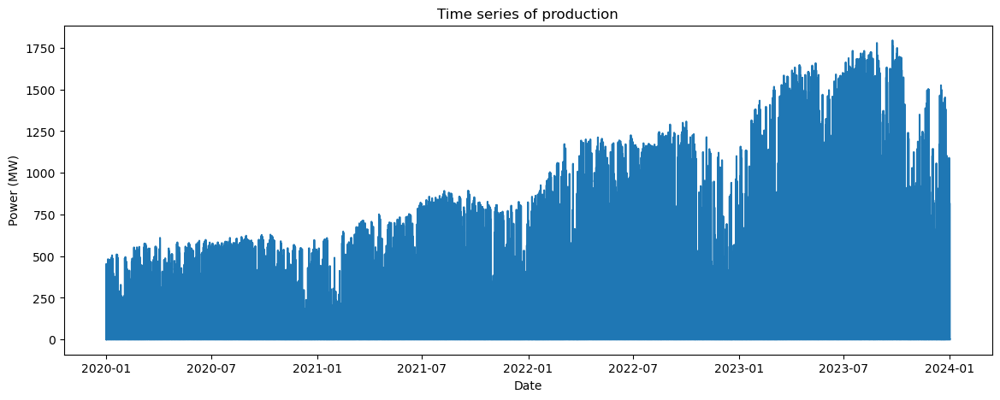

In [42]:
plt.figure(figsize=(14,5))
plt.plot(df_train.index, df_train['production_mw'])
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.title("Time series of production")
plt.show()

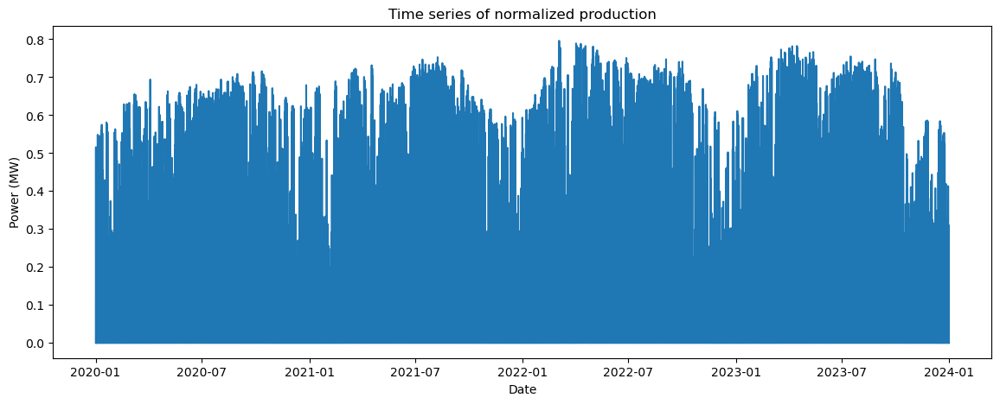

In [43]:
plt.figure(figsize=(14,5))
plt.plot(df_train.index, df_train['production_normalized'])
plt.xlabel("Date")
plt.ylabel("Power (MW)")
plt.title("Time series of normalized production")
plt.show()

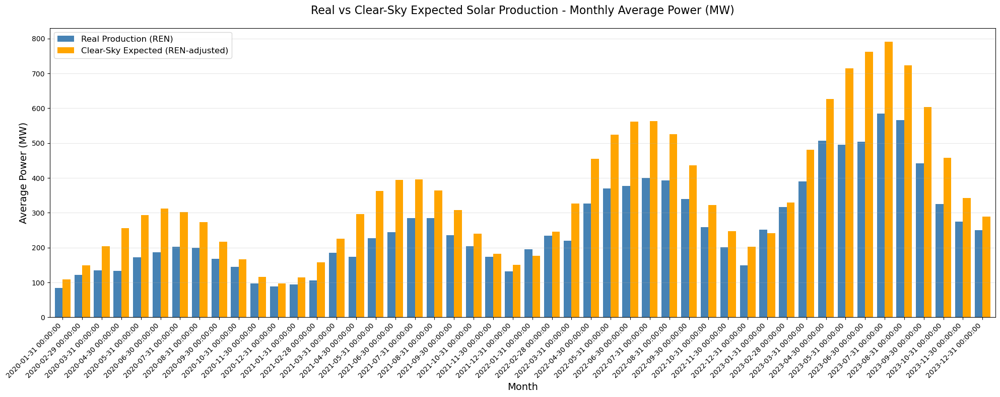

In [44]:
# Actual vs Expected (average monthly MW)
monthly = df_train.resample('ME')[['production_mw', 'production_expected']].mean()  # hourly average → daily average
monthly_plot = monthly.copy()
monthly_plot.columns = ['Real Production (REN)', 'Clear-Sky Expected (REN-adjusted)']

fig, ax = plt.subplots(figsize=(20, 8))
monthly_plot.plot(kind='bar', ax=ax, color=['steelblue', 'orange'], width=0.8)

ax.set_title('Real vs Clear-Sky Expected Solar Production - Monthly Average Power (MW)', fontsize=16, pad=20)
ax.set_ylabel('Average Power (MW)', fontsize=14)
ax.set_xlabel('Month', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, axis='y', alpha=0.3)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

<Figure size 1200x900 with 0 Axes>

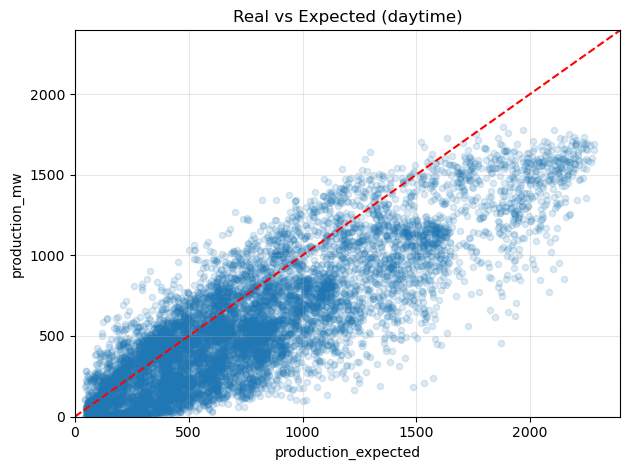

overall correlation: 0.8460


In [45]:
# Scatter real vs expected
daytime_mask = df_train['ClearSky_GHI'] > 50 
sample = df_train[daytime_mask].sample(n=min(10000, len(df)), random_state=42)

plt.figure(figsize=(12, 9))
max_val = max(sample['production_expected'].max(), sample['production_mw'].max()) * 1.05

sample.plot.scatter(x='production_expected', y='production_mw', alpha=0.15, s=20, title='Real vs Expected (daytime)')
corr = sample['production_expected'].corr(sample['production_mw'])
plt.plot([0, max_val], [0, max_val], 'r--', linewidth=1.5)  
plt.grid(True, alpha=0.3)
plt.xlim(0, max_val)
plt.ylim(0, max_val)
plt.tight_layout()
plt.show()

print(f"overall correlation: {corr:.4f}")

hour
0       0.003955
1       0.003330
2       0.003116
3       0.003288
4       0.003065
5       0.003887
6       3.050804
7      51.261807
8     231.407546
9     469.046971
10    649.402430
11    755.485609
12    798.670859
13    795.555561
14    753.357940
15    660.459172
16    504.941393
17    331.434702
18    173.531040
19     52.025856
20      5.185455
21      0.081383
22      0.029004
23      0.026403
Name: production_mw, dtype: float64
month
1     156.805918
2     194.024143
3     232.616709
4     285.591927
5     316.418212
6     328.013967
7     368.002453
8     360.984333
9     296.457595
10    233.596417
11    186.604462
12    154.708182
Name: production_mw, dtype: float64


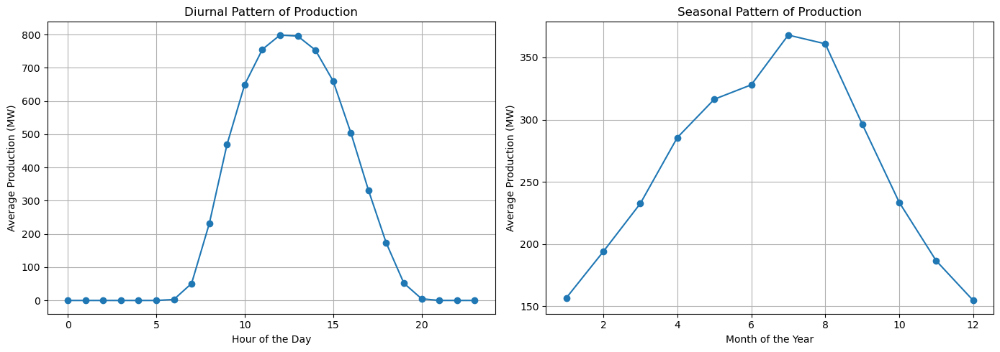

In [46]:
# Temporal Patterns
# Daily Pattern
fig, axs = plt.subplots(1, 2, figsize=(14, 5))

# Daily Pattern
axs[0].plot(df_train.groupby('hour')['production_mw'].mean(), marker='o')
axs[0].set_title('Diurnal Pattern of Production')
axs[0].set_xlabel('Hour of the Day')
axs[0].set_ylabel('Average Production (MW)')
axs[0].grid(True)
print(df_train.groupby('hour')['production_mw'].mean())

# Seasonal Pattern
axs[1].plot(df_train.groupby('month')['production_mw'].mean(), marker='o')
axs[1].set_title('Seasonal Pattern of Production')
axs[1].set_xlabel('Month of the Year')
axs[1].set_ylabel('Average Production (MW)')
axs[1].grid(True)
print(df_train.groupby('month')['production_mw'].mean())

plt.tight_layout()
plt.show()

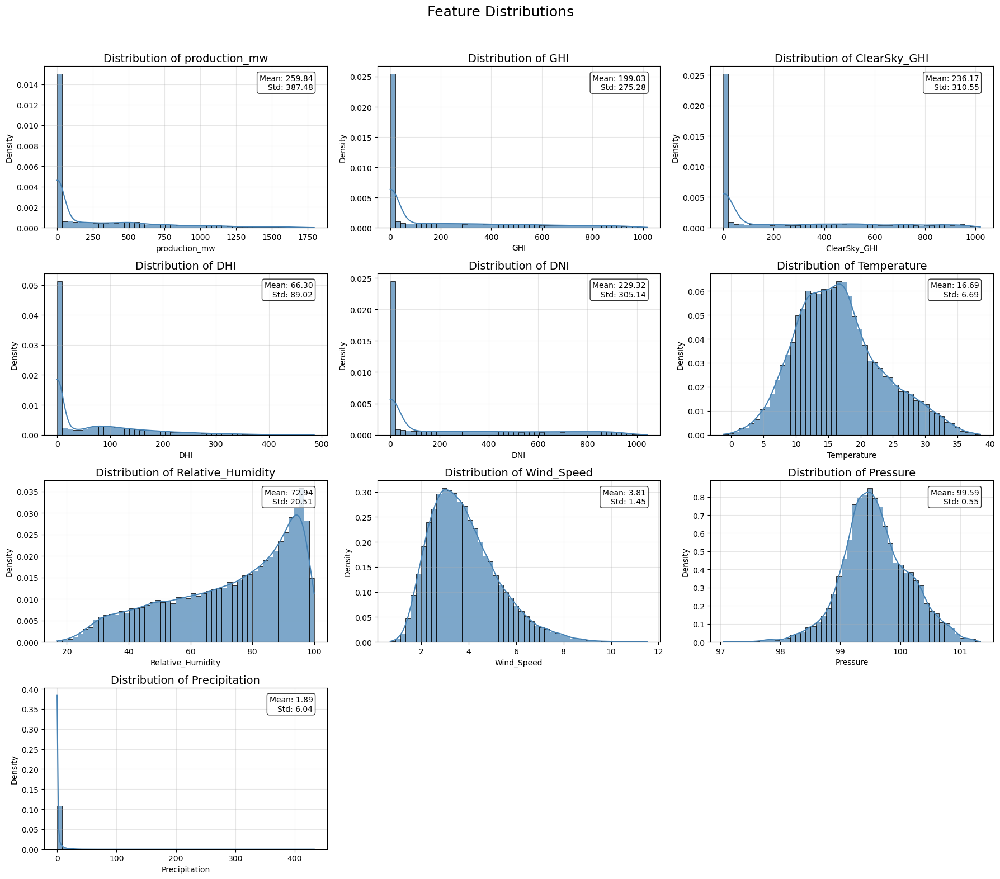

In [47]:
feature_variables = [
 'production_mw',
 'GHI',
 'ClearSky_GHI',
 'DHI',
 'DNI',
 'Temperature',
 'Relative_Humidity',
 'Wind_Speed',
 'Pressure',
 'Precipitation',
 ] 

num_vars = len(feature_variables)
num_cols = 3
num_rows = (num_vars + num_cols - 1) // num_cols  # Ceiling division

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 4 * num_rows))
axes = axes.flatten() 

# Loop through each feature and plot its distribution
for idx, column in enumerate(feature_variables):
    ax = axes[idx]
    
    # Plot histogram with Kernel Density Estimation (KDE)
    sns.histplot(
        df_train[column], 
        kde=True,          
        ax=ax, 
        color='steelblue', 
        bins=50,           
        stat="density",    
        alpha=0.7          
    )
    
    # Set labels and title
    ax.set_title(f'Distribution of {column}', fontsize=14)
    ax.set_xlabel(column)
    ax.set_ylabel('Density')
    ax.grid(True, alpha=0.3)  
 
    # statistics
    mean_value = df_train[column].mean()
    std_value = df_train[column].std()
    ax.text(
        0.95, 0.95, 
        f'Mean: {mean_value:.2f}\nStd: {std_value:.2f}',
        transform=ax.transAxes, 
        fontsize=10, 
        verticalalignment='top',
        horizontalalignment='right', 
        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8)
    )

# Remove empty subplots
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle('Feature Distributions', fontsize=18, y=0.98)
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()

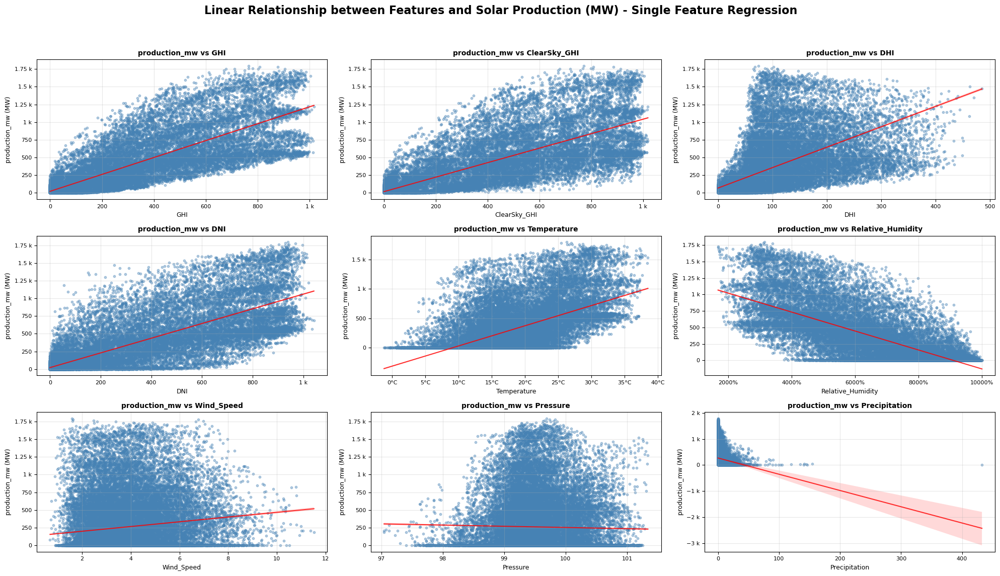

In [48]:
feature_var = [
 'GHI',
 'ClearSky_GHI',
 'DHI',
 'DNI',
 'Temperature',
 'Relative_Humidity',
 'Wind_Speed',
 'Pressure',
 'Precipitation',
 ] 

num_features = len(feature_var)
num_columns = 3
num_rows = (num_features + num_columns - 1) // num_columns  # Ceiling division

fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 4 * num_rows))
axes = axes.flatten()  # Flatten to 1D array for easier iteration

# Loop through each feature and create regression plot
for idx, feature_name in enumerate(feature_var):
    ax = axes[idx]
    
    # Create scatter plot with linear regression line
    sns.regplot(
        x=df_train[feature_name],
        y=df_train['production_mw'],
        scatter_kws={
            "color": "steelblue", 
            "alpha": 0.4,         
            "s": 10                
        },
        line_kws={
            "color": "red",     
            "alpha": 0.8,         
            "linewidth": 1.5      
        },
        ax=ax
    )
    
    # labels
    ax.set_title(f'production_mw vs {feature_name}', fontsize=10, fontweight="bold")
    ax.set_xlabel(feature_name, fontsize=9)
    ax.set_ylabel('production_mw (MW)', fontsize=9)
    
    # Format y-axis (k, M, etc.)
    ax.yaxis.set_major_formatter(ticker.EngFormatter())
    
    # Apply formatting based on feature type
    if 'GHI' in feature_name or 'DNI' in feature_name or 'DHI' in feature_name:
        # Solar irradiance: format with engineering notation (W/m² → kW/m²)
        ax.xaxis.set_major_formatter(ticker.EngFormatter())
    elif 'Temperature' in feature_name:
        # Temperature: format with degree Celsius symbol
        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:.0f}°C'))
    elif 'Humidity' in feature_name:
        # Relative humidity: format as percentage
        ax.xaxis.set_major_formatter(ticker.PercentFormatter(xmax=1.0))

    ax.tick_params(labelsize=8)  
    ax.grid(True, alpha=0.3)     

# Remove empty subplots (if any)
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])


plt.suptitle('Linear Relationship between Features and Solar Production (MW) - Single Feature Regression', 
    fontsize=16,  fontweight="bold", y=0.98)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for title
plt.show()

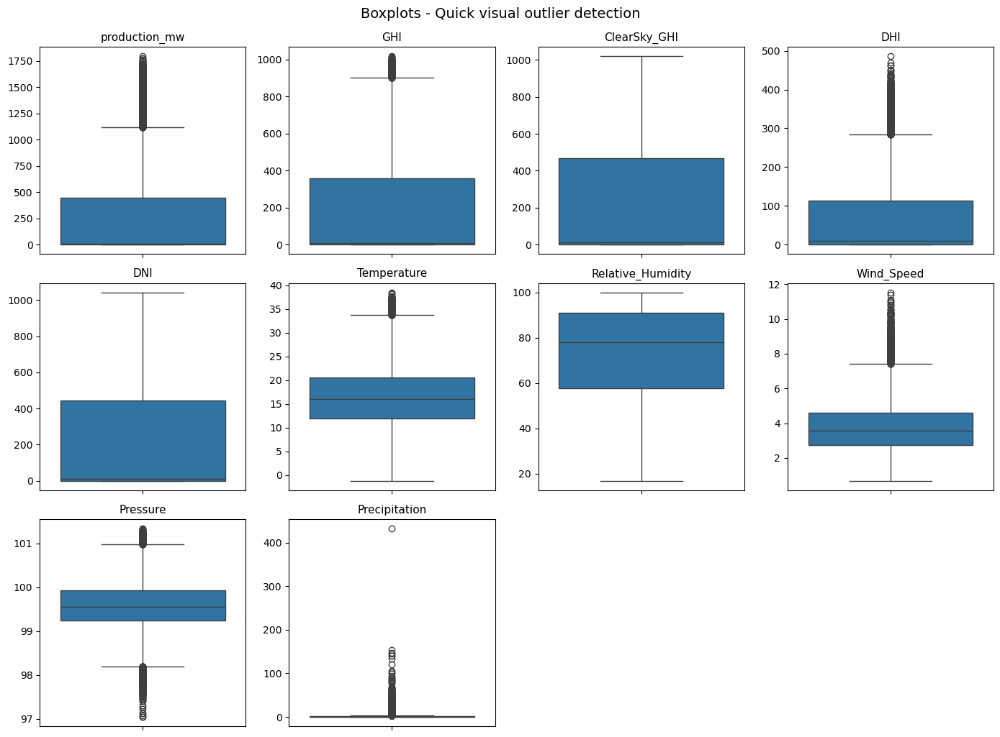

In [49]:
plt.figure(figsize=(14, 10))

for i, var in enumerate(vars_to_check, 1):
    plt.subplot(3, 4, i)
    sns.boxplot(y=df_train[var])
    plt.title(var, fontsize=11)
    plt.ylabel('')

plt.tight_layout()
plt.suptitle("Boxplots - Quick visual outlier detection", y=1.02, fontsize=14)
plt.show()


Correlations with Production
production_mw        1.000
production_lag_1h    0.949
GHI                  0.849
ClearSky_GHI         0.821
DNI                  0.817
production_lag_2h    0.815
DHI                  0.662
production_lag_3h    0.629
Temperature          0.593
year                 0.256
capacity_mw_ren      0.250
Wind_Speed           0.125
hour                 0.122
production_lag_6h    0.017
month                0.004
day_sin             -0.013
Pressure            -0.024
Precipitation       -0.097
hour_sin            -0.141
day_cos             -0.188
hour_cos            -0.724
Relative_Humidity   -0.762
Name: production_mw, dtype: float64


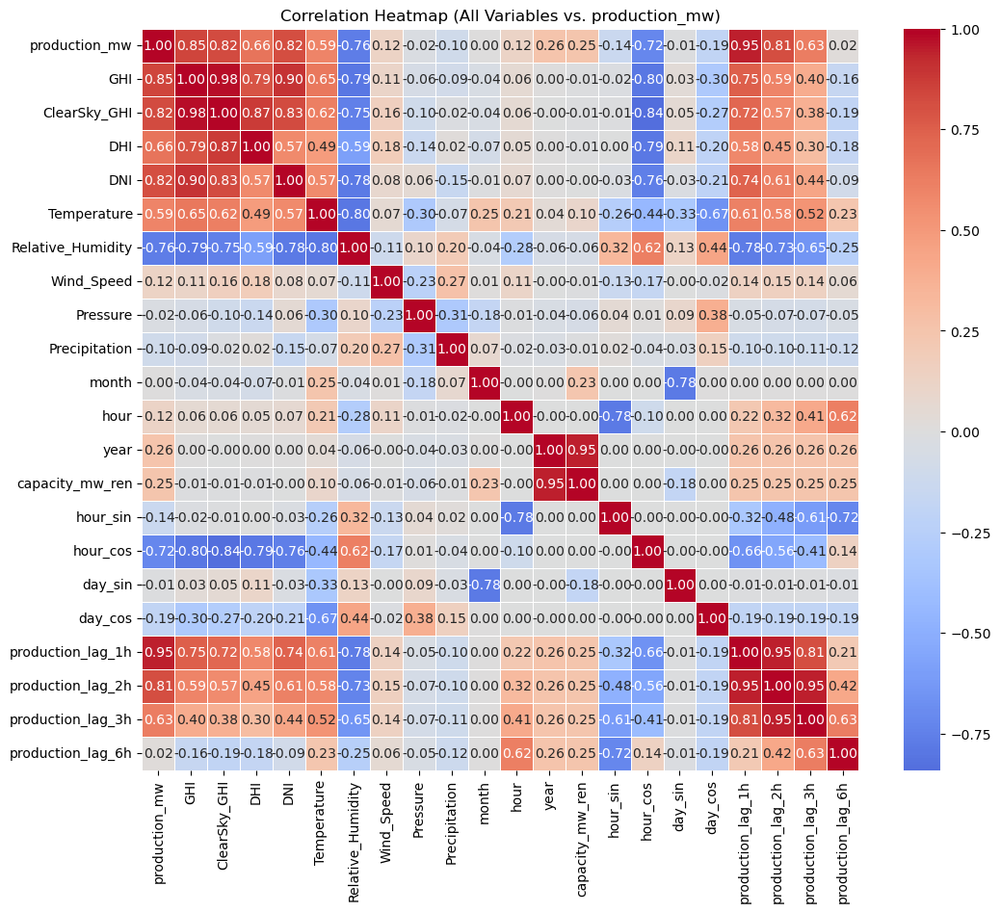

In [50]:
print("\nCorrelations with Production")
features = ['production_mw', 'GHI', 'ClearSky_GHI', 'DHI', 'DNI', 'Temperature',
            'Relative_Humidity', 'Wind_Speed', 'Pressure', 'Precipitation', 'month', 'hour','year', 
            'capacity_mw_ren', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'production_lag_1h',
            'production_lag_2h', 'production_lag_3h', 'production_lag_6h']

corr_matrix = df_train[features].corr()
print(corr_matrix['production_mw'].sort_values(ascending=False).round(3))

plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', center=0, linewidths=0.5)
plt.title('Correlation Heatmap (All Variables vs. production_mw)')
plt.show()

In [53]:
CORE_FEATURES = [
    'GHI', 'ClearSky_GHI', 'DNI', 'DHI', 'Temperature', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos',
    'production_lag_1h', 'production_lag_2h', 'production_lag_3h'
]

TARGET_NORM = 'production_normalized'
TARGET_REAL = 'production_mw'

# Training set
X_train = df_train[CORE_FEATURES]
y_train = df_train[TARGET_NORM]                    # Normalized target (for training)
y_train_real = df_train[TARGET_REAL] 

# Test set
X_test  = df_test[CORE_FEATURES]
y_test  = df_test[TARGET_NORM]                     # Normalized target
y_test_real = df_test[TARGET_REAL]                 # Actual production in MW
capacity_test = df_test['capacity_mw_ren']

# Final summary
print(f"\nModel Preparation:")
print(f" Number of features: {len(CORE_FEATURES)}")


Model Preparation:
 Number of features: 12


## Statistical Analysis

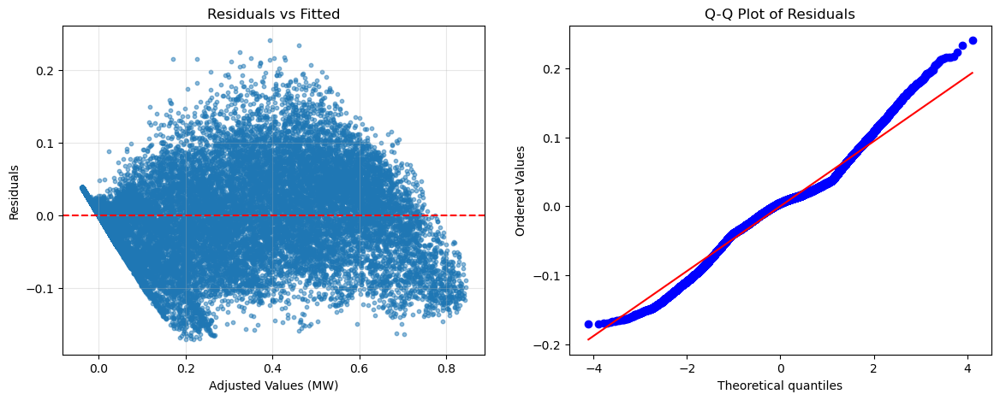

In [56]:
# Linearity of Residuals
# Train OLS
X_train_sm = sm.add_constant(X_train)
ols_model = sm.OLS(y_train, X_train_sm).fit()

# Plot 1: Residuals vs Fitted
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].scatter(ols_model.fittedvalues, ols_model.resid, alpha=0.5, s=10)
axes[0].axhline(y=0, color='r', linestyle='--')
axes[0].set_xlabel('Adjusted Values (MW)')
axes[0].set_ylabel('Residuals')
axes[0].set_title('Residuals vs Fitted')
axes[0].grid(True, alpha=0.3)

# Plot 2: Q-Q Plot (Normality)
from scipy import stats
stats.probplot(ols_model.resid, dist="norm", plot=axes[1])
axes[1].set_title('Q-Q Plot of Residuals')
plt.show()

In [57]:
#Homoscedasticity (Constant Error Variance)
#Test: Breusch-Pagan
bp_test = het_breuschpagan(ols_model.resid, X_train_sm)

labels = ['Lagrange multiplier statistic', 'p-value', 'f-value', 'f p-value']
print("\nBreusch-Pagan Test (Homoscedasticity):")
for label, value in zip(labels, bp_test):
    print(f"  {label}: {value:.4f}")

if bp_test[1] < 0.05:
    print("p-value < 0.05 → Heteroscedasticity")
else:
    print("p-value > 0.05 → Homoscedasticity")


Breusch-Pagan Test (Homoscedasticity):
  Lagrange multiplier statistic: 10510.3427
  p-value: 0.0000
  f-value: 1250.4077
  f p-value: 0.0000
p-value < 0.05 → Heteroscedasticity


In [58]:
#Independence of Errors (No Autocorrelation) - Durbin-Watson - tests autocorrelation in the residuals
dw_stat = durbin_watson(ols_model.resid)
print(f"\nurbin-Watson Test (autocorrelation): {dw_stat:.4f}")

if 1.5 <= dw_stat <= 2.5:
    print("There is no autocorrelation")
else:
    print("Autocorrelation detected")
    ols_hac = sm.OLS(y_train, X_train_sm).fit(cov_type='HAC', cov_kwds={'maxlags': 6})
    print(ols_hac.summary())


urbin-Watson Test (autocorrelation): 0.3722
Autocorrelation detected
                              OLS Regression Results                             
Dep. Variable:     production_normalized   R-squared:                       0.959
Model:                               OLS   Adj. R-squared:                  0.959
Method:                    Least Squares   F-statistic:                 1.409e+04
Date:                   Tue, 30 Jun 2026   Prob (F-statistic):               0.00
Time:                           02:08:43   Log-Likelihood:                 56825.
No. Observations:                  35058   AIC:                        -1.136e+05
Df Residuals:                      35045   BIC:                        -1.135e+05
Df Model:                             12                                         
Covariance Type:                     HAC                                         
                        coef    std err          z      P>|z|      [0.025      0.975]
------------------------

In [59]:
# Multicollinearity (VIF > 10 is Critical) - Variance Inflation Factor
vif_data = pd.DataFrame()
vif_data['Feature'] = CORE_FEATURES
vif_data['VIF'] = [variance_inflation_factor(X_train.values, i) for i in range(len(CORE_FEATURES))]

print("\nMulticollinearity (VIF):")
print(vif_data.sort_values('VIF', ascending=False).to_string(index=False))


Multicollinearity (VIF):
          Feature        VIF
production_lag_2h 216.210381
     ClearSky_GHI 100.252097
              GHI  86.493241
production_lag_1h  80.772551
production_lag_3h  69.550358
              DNI  14.516295
              DHI  12.459121
      Temperature  10.059328
         hour_cos   5.446483
         hour_sin   1.909951
          day_sin   1.286815
          day_cos   1.225500


In [60]:
# Shapiro-Wilk test 
sample_resid = np.random.choice(ols_model.resid, size=5000, replace=False)
shapiro_test = shapiro(sample_resid)

print(f"\nShapiro-Wilk Test (Normality): p-value = {shapiro_test[1]:.6f}")
if shapiro_test[1] < 0.05:
    print("Residuals are not normal")
else:
    print("Residuals are normal")


Shapiro-Wilk Test (Normality): p-value = 0.000000
Residuals are not normal


## Models

In [62]:
def persistence_baseline(y_true, lag_hours=1):
    # ŷ[t] = y[t-lag_hours]
    
    persistence_pred = y_true.shift(lag_hours)
    valid_mask = ~persistence_pred.isna() #Remove NAN
    return y_true[valid_mask], persistence_pred[valid_mask]

In [63]:
def evaluate_model(y_true_mw, y_pred_mw, model_name, set_name='Test', min_threshold_mw=10):

    # hours with relevant production
    mask = y_true_mw > min_threshold_mw
    
    mae = mean_absolute_error(y_true_mw, y_pred_mw)
    rmse = np.sqrt(mean_squared_error(y_true_mw, y_pred_mw))
    r2 = r2_score(y_true_mw, y_pred_mw)
    
    # MAPE only for hours with production > threshold
    if mask.sum() > 0:
        mape = mean_absolute_percentage_error(y_true_mw[mask], y_pred_mw[mask]) * 100
    else:
        mape = np.nan
    
    print(f"\n{model_name} ({set_name} set)")
    print(f"   MAE  : {mae:.1f} MW")
    print(f"   RMSE : {rmse:.1f} MW")
    print(f"   R²   : {r2:.4f}")
    if np.isnan(mape):
        print(f"   MAPE : N/A (no hours > {min_threshold_mw} MW)")
    else:
        print(f"   MAPE : {mape:.1f}% (on {mask.sum():,} hours > {min_threshold_mw} MW)")
    
    return {
        'Model': model_name,
        'Set': set_name,
        'MAE (MW)': round(mae, 1),
        'RMSE (MW)': round(rmse, 1),
        'R2': round(r2, 4),
        'MAPE (%)': round(mape, 1) if not np.isnan(mape) else None,
        'Hours > threshold': mask.sum()
    }
results = []

In [64]:
def plot_sample_week(y_true, y_pred, model_name, n_samples=4, seed=42):
    if not isinstance(y_pred, pd.Series):
        y_pred = pd.Series(y_pred, index=y_true.index)
    
    np.random.seed(seed)
    
    if len(y_true) < 168:
        raise ValueError("The test set is too small")

    possible_start_indices = np.arange(len(y_true) - 167)
    
    chosen_start_indices = np.random.choice(possible_start_indices, size=n_samples, replace=False)
    
    # subplots
    fig, axes = plt.subplots(n_samples, 1, figsize=(16, 4.5 * n_samples))
    if n_samples == 1:
        axes = [axes]
    
    for i, start_idx in enumerate(chosen_start_indices):
        week_slice = slice(start_idx, start_idx + 168)
        week_data_true = y_true.iloc[week_slice]
        week_data_pred = y_pred.iloc[week_slice]
        
        ax = axes[i]
        ax.plot(week_data_true.index, week_data_true.values,
                label='Observed', color='black', linewidth=1.8)
        ax.plot(week_data_pred.index, week_data_pred.values,
                label='Predicted', color='steelblue', linewidth=1.5, alpha=0.9)
        
        start_date = week_data_true.index[0].strftime('%d/%m/%Y')
        ax.set_title(f'{model_name} — Week starting on: {start_date}', fontsize=14)
        ax.set_ylabel('Power (MW)', fontsize=12)
        ax.legend(fontsize=12)
        ax.grid(True, alpha=0.3)
        ax.tick_params(axis='x', rotation=30, labelsize=10)
    
    plt.tight_layout()
    plt.show()

In [65]:
def plot_permutation_importance(model, X, y, model_name, top_n=10):
    result = permutation_importance(
        model, X, y,
        n_repeats=15,          
        random_state=42,
        n_jobs=-1,
        scoring='neg_mean_absolute_error'  
    )
    
    importances = pd.Series(result.importances_mean, index=X.columns).sort_values(ascending=False)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    bars = importances.head(top_n).plot.bar(
        yerr=result.importances_std[:top_n], 
        capsize=4, 
        color='steelblue',
        ax=ax
    )
        
    ax.set_title(f'Top {top_n} Feature Importances - {model_name}', fontsize=14, fontweight='bold')
    ax.set_ylabel('MAE (MW)', fontsize=12)
    ax.tick_params(axis='x', rotation=45)
    ax.grid(True, alpha=0.3, axis='y')
        
    plt.tight_layout()
    plt.show()
    
    return importances

In [66]:
automl_settings = {
    "task": "regression",
    "metric": "mae",                    
    "time_budget": 600,                 
    "early_stop": True,                 # early stopping for boosting models
    "n_jobs": -1,                       # Use all CPU cores
    "eval_method": "cv",                # Use cross-validation
    "split_type": "time",               # time-series aware splitting
    "n_splits": 5,                      
    "seed": 42,                         
}

In [68]:
# Test set
y_test_pers_true, y_test_pers_pred = persistence_baseline(y_test_real, lag_hours=1)
metrics_persistence = evaluate_model(
    y_true_mw=y_test_pers_true,
    y_pred_mw=y_test_pers_pred,
    model_name='Persistence (1h)',
    set_name='Test'
)
results.append(metrics_persistence)


Persistence (1h) (Test set)
   MAE  : 146.3 MW
   RMSE : 248.3 MW
   R²   : 0.8926
   MAPE : 97.8% (on 4,470 hours > 10 MW)


## Scenario 1: Train on MW

### Decision Tree

In [72]:
start_time = time.time()
model_default = DecisionTreeRegressor(random_state=42)  
model_default.fit(X_train, y_train_real)
train_time_default = time.time() - start_time

pred_mw_default = model_default.predict(X_test)

metrics_default = evaluate_model(y_test_real, pred_mw_default, 'Decision Tree (Default - S1)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)


Decision Tree (Default - S1) (Test set)
   MAE  : 102.6 MW
   RMSE : 203.4 MW
   R²   : 0.9280
   MAPE : 24.8% (on 4,470 hours > 10 MW)


### Random Forest


Random Forest (Default - S1) (Test set)
   MAE  : 98.6 MW
   RMSE : 196.9 MW
   R²   : 0.9325
   MAPE : 22.9% (on 4,470 hours > 10 MW)


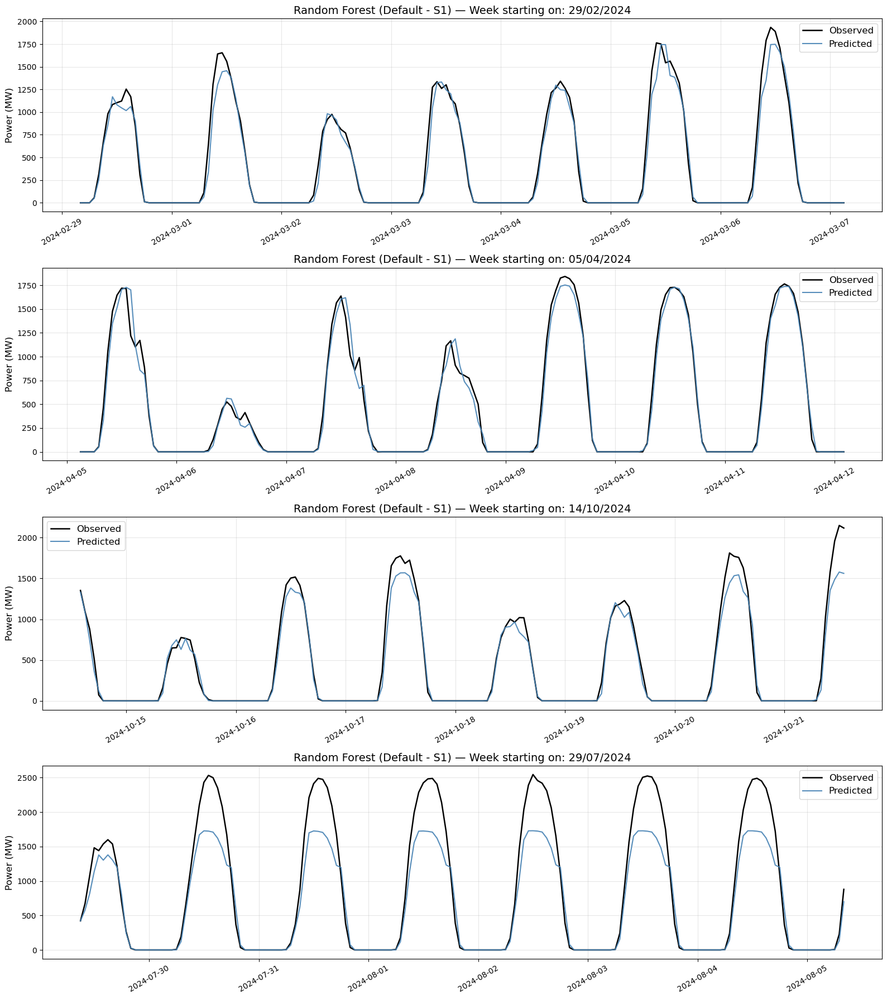

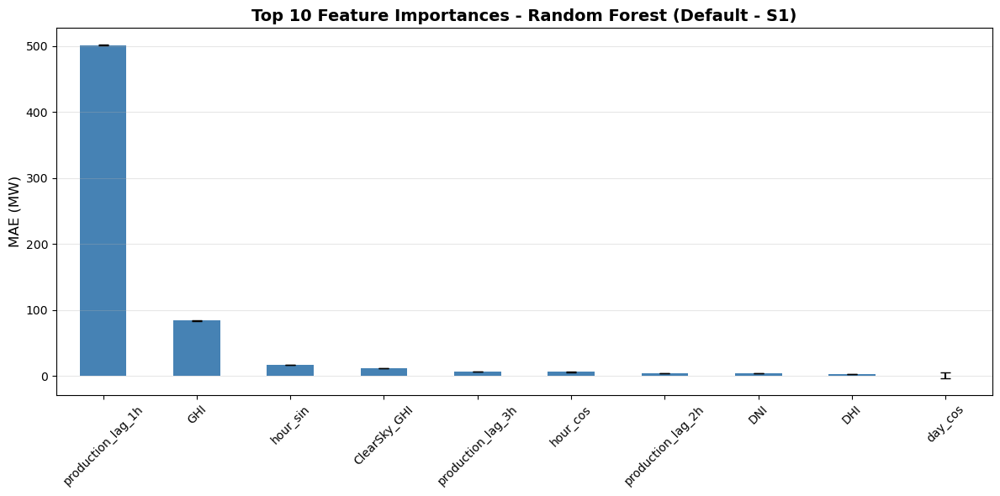

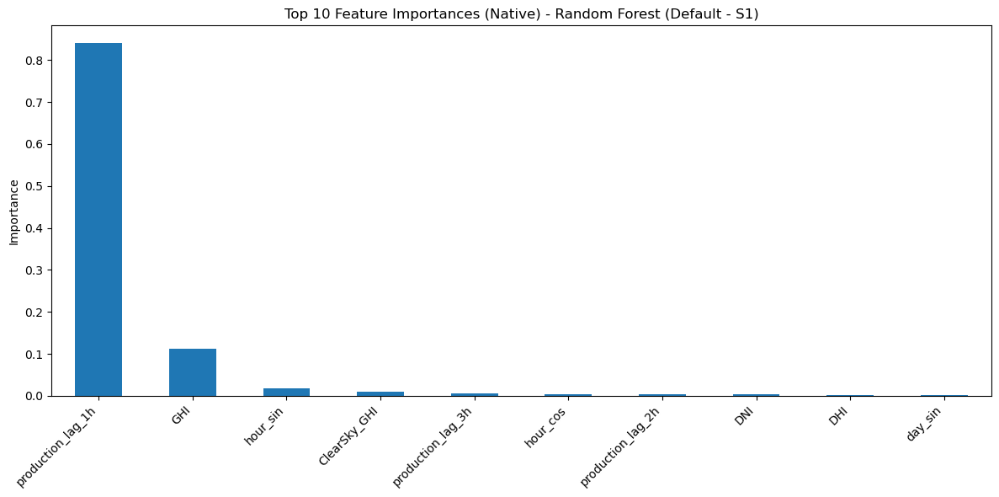

In [74]:
start_time = time.time()
model_default = RandomForestRegressor(
    random_state=42,
    n_jobs=-1
) 
model_default.fit(X_train, y_train_real)
train_time_default = time.time() - start_time

pred_mw_default = model_default.predict(X_test)

metrics_default = evaluate_model(y_test_real, pred_mw_default, 'Random Forest (Default - S1)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)

plot_sample_week(y_test_real, pred_mw_default, 'Random Forest (Default - S1)', n_samples=4)

plot_permutation_importance(model_default, X_test, y_test_real, "Random Forest (Default - S1)")

#Native Feature importance 
importances = pd.Series(model_default.feature_importances_,index=X_train.columns).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
importances.head(10).plot(kind="bar")   
plt.title("Top 10 Feature Importances (Native) - Random Forest (Default - S1)")
plt.ylabel("Importance")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

[flaml.automl.logger: 06-30 02:09:10] {2133} INFO - task = regression
[flaml.automl.logger: 06-30 02:09:10] {2144} INFO - Evaluation method: cv
[flaml.automl.logger: 06-30 02:09:10] {2243} INFO - Minimizing error metric: mae
[flaml.automl.logger: 06-30 02:09:10] {2360} INFO - List of ML learners in AutoML Run: ['rf']
[flaml.automl.logger: 06-30 02:09:10] {2665} INFO - iteration 0, current learner rf
[flaml.automl.logger: 06-30 02:09:11] {2800} INFO - Estimated sufficient time budget=6338s. Estimated necessary time budget=6s.
[flaml.automl.logger: 06-30 02:09:11] {2851} INFO -  at 0.7s,	estimator rf's best error=98.9952,	best estimator rf's best error=98.9952
[flaml.automl.logger: 06-30 02:09:11] {2665} INFO - iteration 1, current learner rf
[flaml.automl.logger: 06-30 02:09:12] {2851} INFO -  at 1.4s,	estimator rf's best error=95.0149,	best estimator rf's best error=95.0149
[flaml.automl.logger: 06-30 02:09:12] {2665} INFO - iteration 2, current learner rf
[flaml.automl.logger: 06-30 0

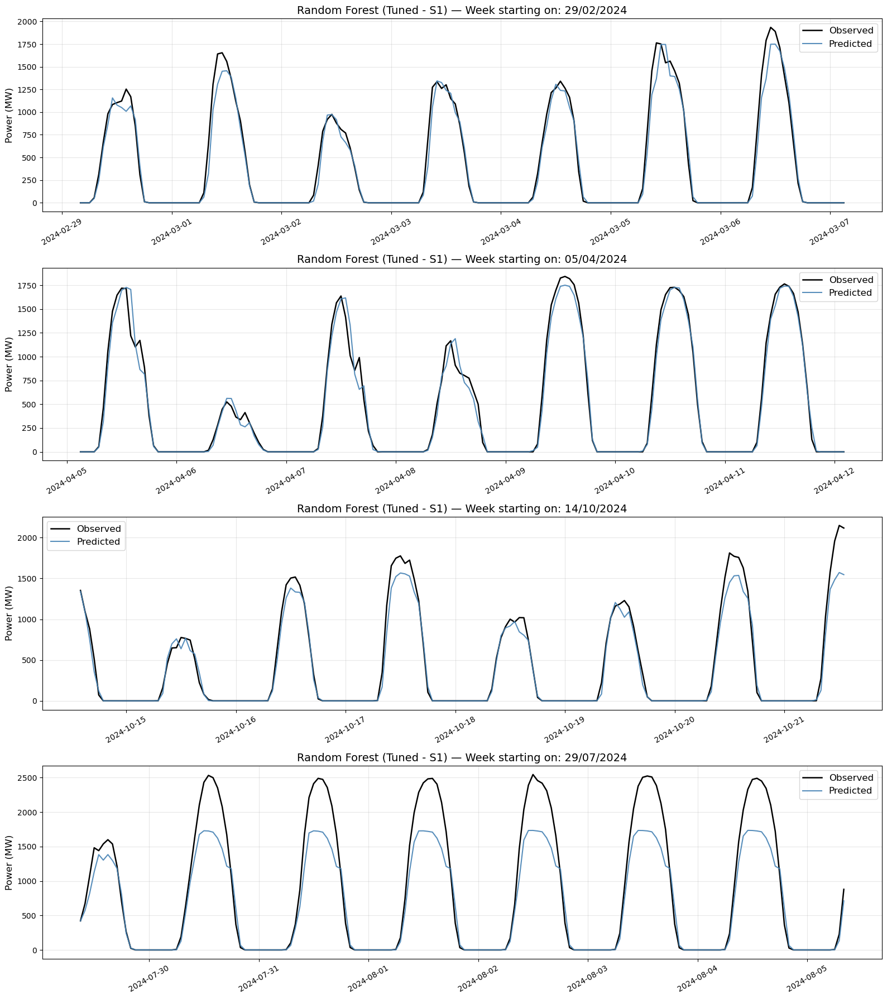

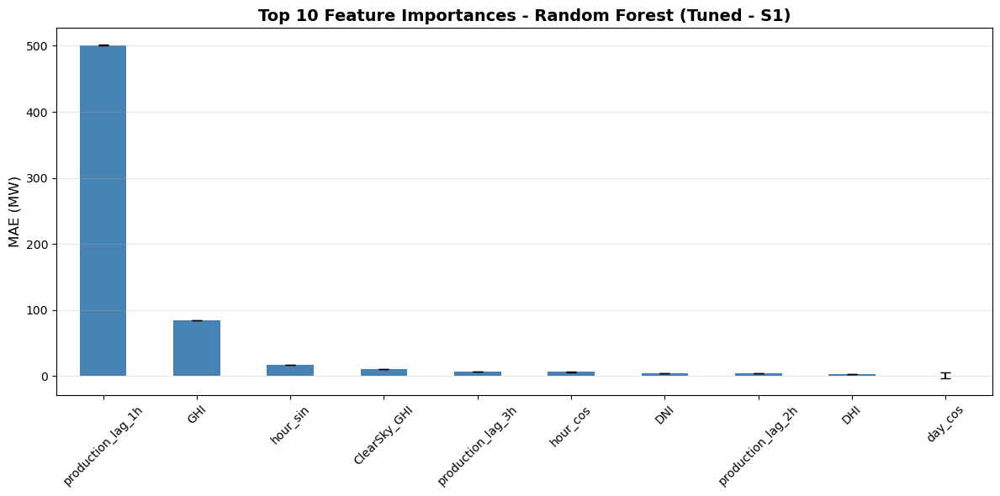

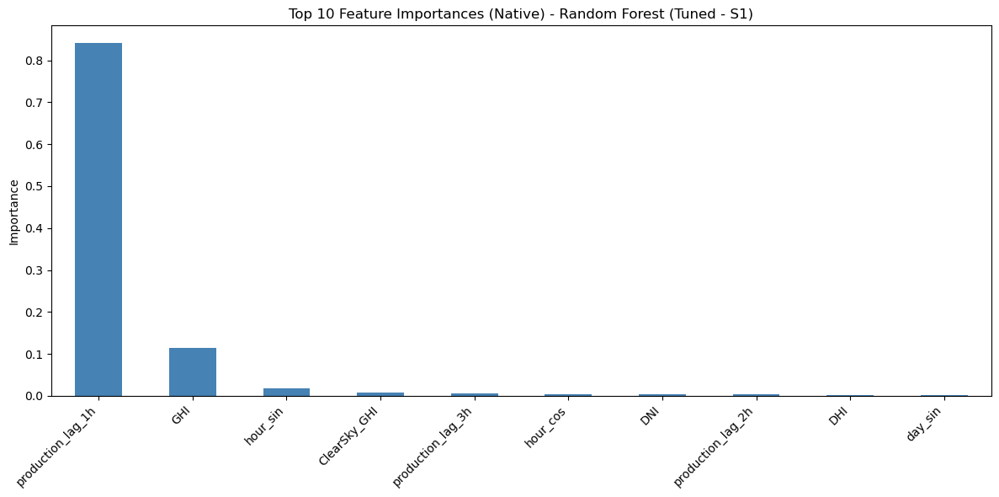

In [75]:
start_time = time.time()

automl_rf = AutoML()
automl_rf.fit(
    X_train=X_train,
    y_train=y_train_real,
    estimator_list=["rf"], 
    **automl_settings
)

tune_time_rf = time.time() - start_time

print(f"\nTuning time (Random Forest): {tune_time_rf:.1f} seconds")
print("Best configuration (auto-found):", automl_rf.best_config)
print("Best validation MAE:", automl_rf.best_loss)

# Final predictions
pred_mw_rf = automl_rf.predict(X_test)

# Evaluation and plots
metrics_rf = evaluate_model(y_test_real, pred_mw_rf, 'Random Forest (Tuned - S1)')
metrics_rf['Time (s)'] = round(tune_time_rf, 2)
results.append(metrics_rf)

plot_sample_week(y_test_real, pred_mw_rf, 'Random Forest (Tuned - S1)', n_samples=4)

tuned_model = automl_rf.model.estimator

plot_permutation_importance(tuned_model, X_test, y_test_real, "Random Forest (Tuned - S1)")

# Native feature importance
importances = pd.Series(tuned_model.feature_importances_, index=X_train.columns).sort_values(ascending=False)
plt.figure(figsize=(12, 6))
importances.head(10).plot.bar(color='steelblue')
plt.title('Top 10 Feature Importances (Native) - Random Forest (Tuned - S1)')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### XGBoost


XGBoost (Default - S1) (Test set)
   MAE  : 97.1 MW
   RMSE : 199.6 MW
   R²   : 0.9306
   MAPE : 20.0% (on 4,470 hours > 10 MW)


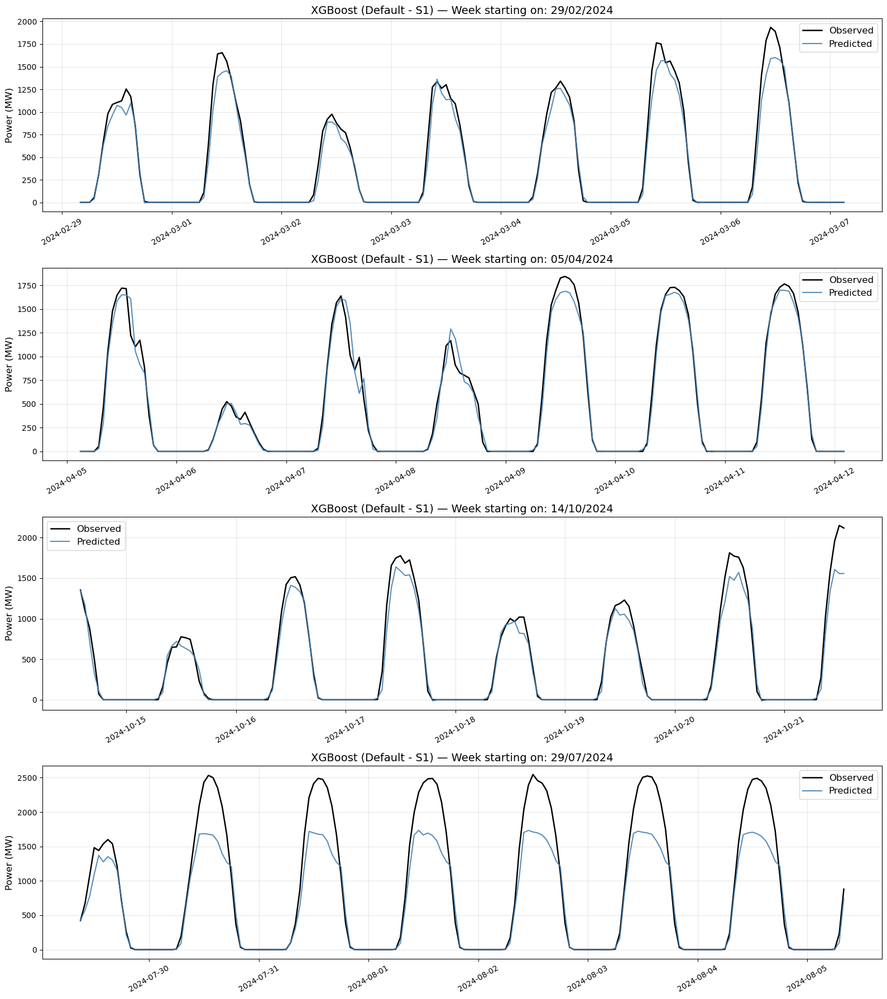

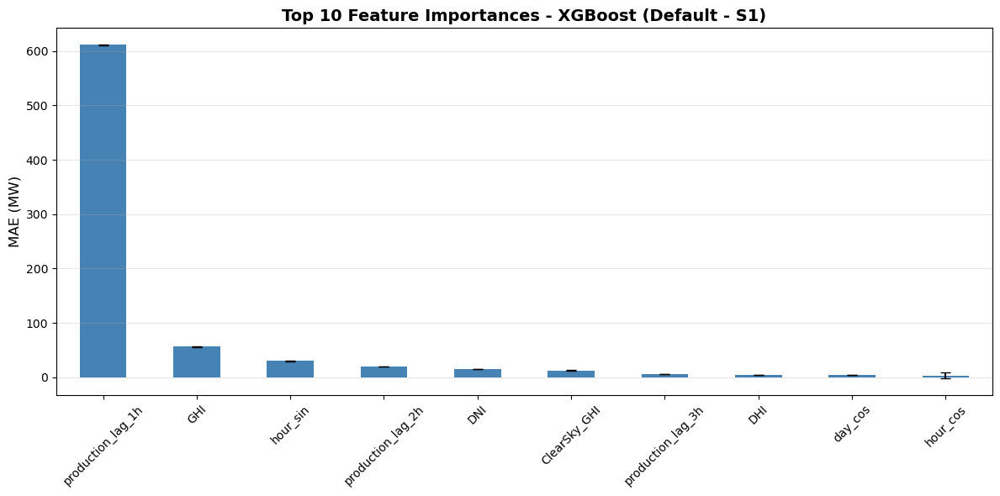

production_lag_1h    610.981561
GHI                   56.355049
hour_sin              30.077993
production_lag_2h     20.078201
DNI                   14.912356
ClearSky_GHI          12.661694
production_lag_3h      5.704196
DHI                    4.679881
day_cos                4.354546
hour_cos               3.515510
Temperature            2.296674
day_sin                1.117294
dtype: float64

In [77]:
start_time = time.time()
model_default = xgb.XGBRegressor(random_state=42, n_jobs=-1) 
model_default.fit(X_train, y_train_real)
train_time_default = time.time() - start_time

pred_mw_default = model_default.predict(X_test)

metrics_default = evaluate_model(y_test_real, pred_mw_default, 'XGBoost (Default - S1)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)

plot_sample_week(y_test_real, pred_mw_default, 'XGBoost (Default - S1)', n_samples=4)
plot_permutation_importance(model_default, X_test, y_test_real, "XGBoost (Default - S1)")

[flaml.automl.logger: 06-30 02:19:36] {2133} INFO - task = regression
[flaml.automl.logger: 06-30 02:19:36] {2144} INFO - Evaluation method: cv
[flaml.automl.logger: 06-30 02:19:36] {2243} INFO - Minimizing error metric: mae
[flaml.automl.logger: 06-30 02:19:36] {2360} INFO - List of ML learners in AutoML Run: ['xgboost']
[flaml.automl.logger: 06-30 02:19:36] {2665} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 06-30 02:19:36] {2800} INFO - Estimated sufficient time budget=1801s. Estimated necessary time budget=2s.
[flaml.automl.logger: 06-30 02:19:36] {2851} INFO -  at 0.3s,	estimator xgboost's best error=226.4853,	best estimator xgboost's best error=226.4853
[flaml.automl.logger: 06-30 02:19:36] {2665} INFO - iteration 1, current learner xgboost
[flaml.automl.logger: 06-30 02:19:36] {2851} INFO -  at 0.5s,	estimator xgboost's best error=226.4853,	best estimator xgboost's best error=226.4853
[flaml.automl.logger: 06-30 02:19:36] {2665} INFO - iteration 2, current l

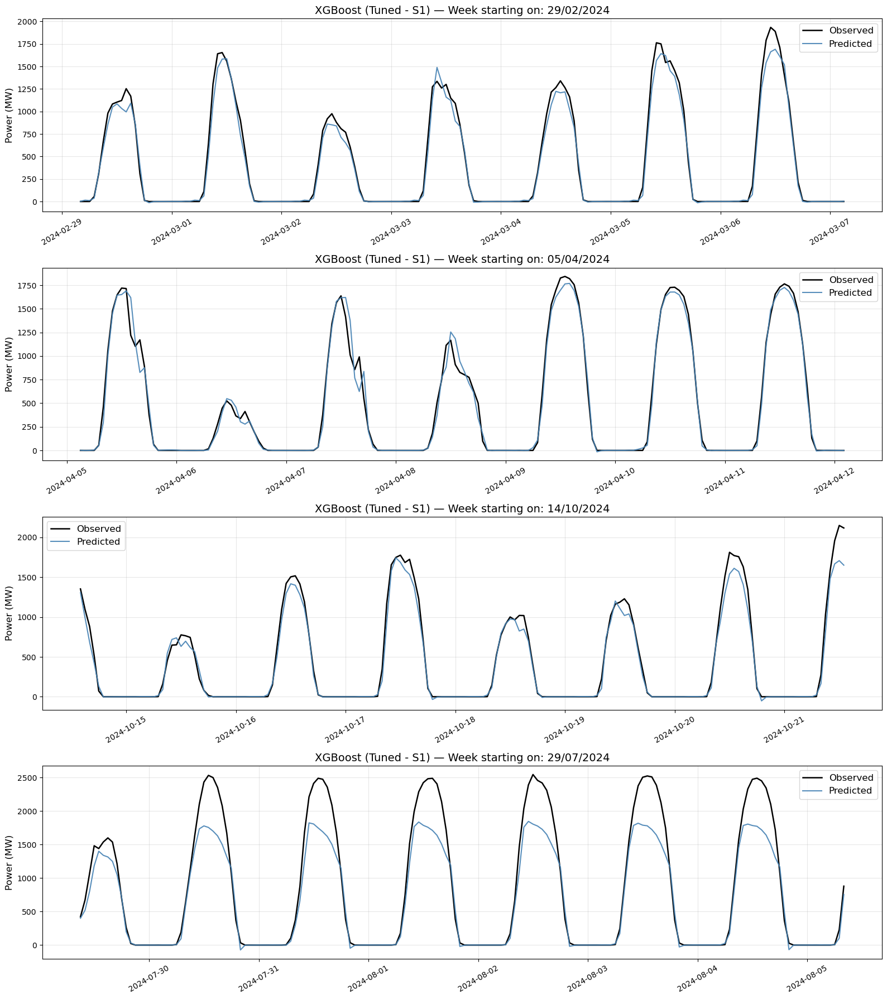

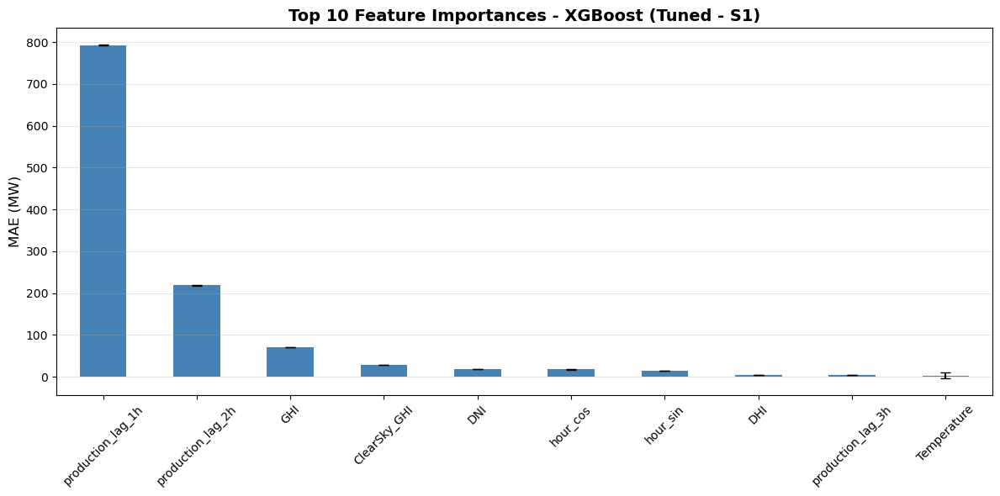

production_lag_1h    793.331676
production_lag_2h    218.558950
GHI                   70.487351
ClearSky_GHI          28.395212
DNI                   17.976252
hour_cos              17.730963
hour_sin              14.750276
DHI                    5.025596
production_lag_3h      4.594835
Temperature            2.929373
day_cos                2.373649
day_sin                1.388992
dtype: float64

In [78]:
start_time = time.time()

automl_xgb = AutoML()
automl_xgb.fit(
    X_train=X_train,
    y_train=y_train_real,
    estimator_list=["xgboost"],  
    **automl_settings
)

tune_time_xgb = time.time() - start_time

print(f"\nTuning time (XGBoost): {tune_time_xgb:.1f} seconds")
print("Best configuration (auto-found):", automl_xgb.best_config)
print("Best validation MAE:", automl_xgb.best_loss)

# Final predictions
pred_mw_xgb = automl_xgb.predict(X_test)

# Evaluation and plots
metrics_xgb = evaluate_model(y_test_real, pred_mw_xgb, 'XGBoost (Tuned - S1)')
metrics_xgb['Time (s)'] = round(tune_time_xgb, 2)
results.append(metrics_xgb)

plot_sample_week(y_test_real, pred_mw_xgb, 'XGBoost (Tuned - S1)', n_samples=4)
tuned_model = automl_xgb.model.estimator
plot_permutation_importance(tuned_model, X_test, y_test_real, "XGBoost (Tuned - S1)")

### LightGBM

[LightGBM] [Info] Total Bins 2588
[LightGBM] [Info] Number of data points in the train set: 35058, number of used features: 12
[LightGBM] [Info] Start training from score 259.835069

LightGBM (Default - S1) (Test set)
   MAE  : 100.0 MW
   RMSE : 201.8 MW
   R²   : 0.9291
   MAPE : 21.3% (on 4,470 hours > 10 MW)


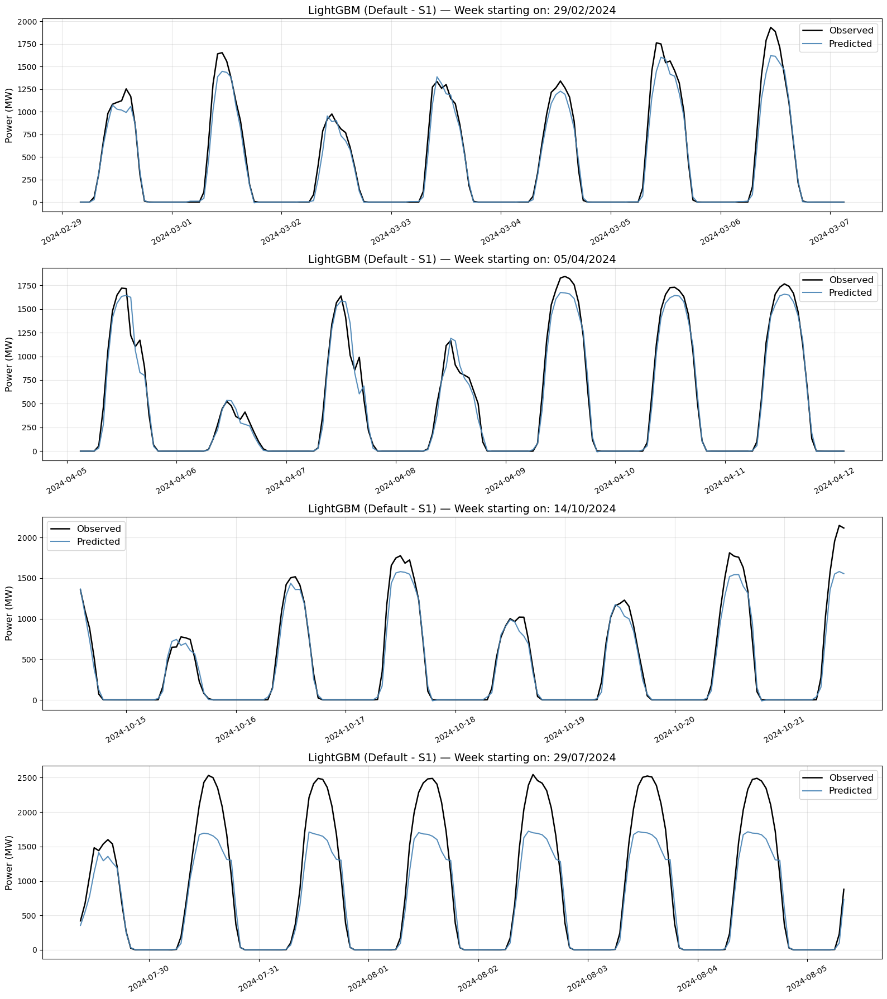

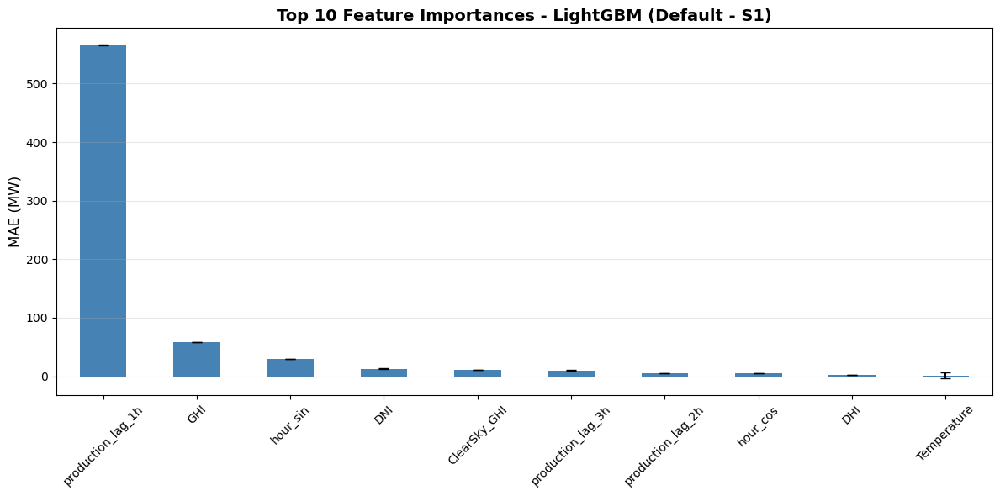

production_lag_1h    565.916412
GHI                   57.826852
hour_sin              29.870609
DNI                   12.854003
ClearSky_GHI          10.735045
production_lag_3h      9.726573
production_lag_2h      5.373500
hour_cos               4.652616
DHI                    2.605755
Temperature            1.308739
day_cos                1.196185
day_sin                1.041631
dtype: float64

In [80]:
start_time = time.time()
model_default = lgb.LGBMRegressor(random_state=42, n_jobs=-1, force_row_wise=True)
model_default.fit(X_train, y_train_real)
train_time_default = time.time() - start_time

pred_mw_default = model_default.predict(X_test)

metrics_default = evaluate_model(y_test_real, pred_mw_default, 'LightGBM (Default - S1)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)

plot_sample_week(y_test_real, pred_mw_default, 'LightGBM (Default - S1)', n_samples=4)
plot_permutation_importance(model_default, X_test, y_test_real, "LightGBM (Default - S1)")

[flaml.automl.logger: 06-30 02:30:13] {2133} INFO - task = regression
[flaml.automl.logger: 06-30 02:30:13] {2144} INFO - Evaluation method: cv
[flaml.automl.logger: 06-30 02:30:13] {2243} INFO - Minimizing error metric: mae
[flaml.automl.logger: 06-30 02:30:13] {2360} INFO - List of ML learners in AutoML Run: ['lgbm']
[flaml.automl.logger: 06-30 02:30:13] {2665} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-30 02:30:14] {2800} INFO - Estimated sufficient time budget=1721s. Estimated necessary time budget=2s.
[flaml.automl.logger: 06-30 02:30:14] {2851} INFO -  at 0.3s,	estimator lgbm's best error=226.5166,	best estimator lgbm's best error=226.5166
[flaml.automl.logger: 06-30 02:30:14] {2665} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-30 02:30:14] {2851} INFO -  at 0.5s,	estimator lgbm's best error=226.5166,	best estimator lgbm's best error=226.5166
[flaml.automl.logger: 06-30 02:30:14] {2665} INFO - iteration 2, current learner lgbm
[flaml.au

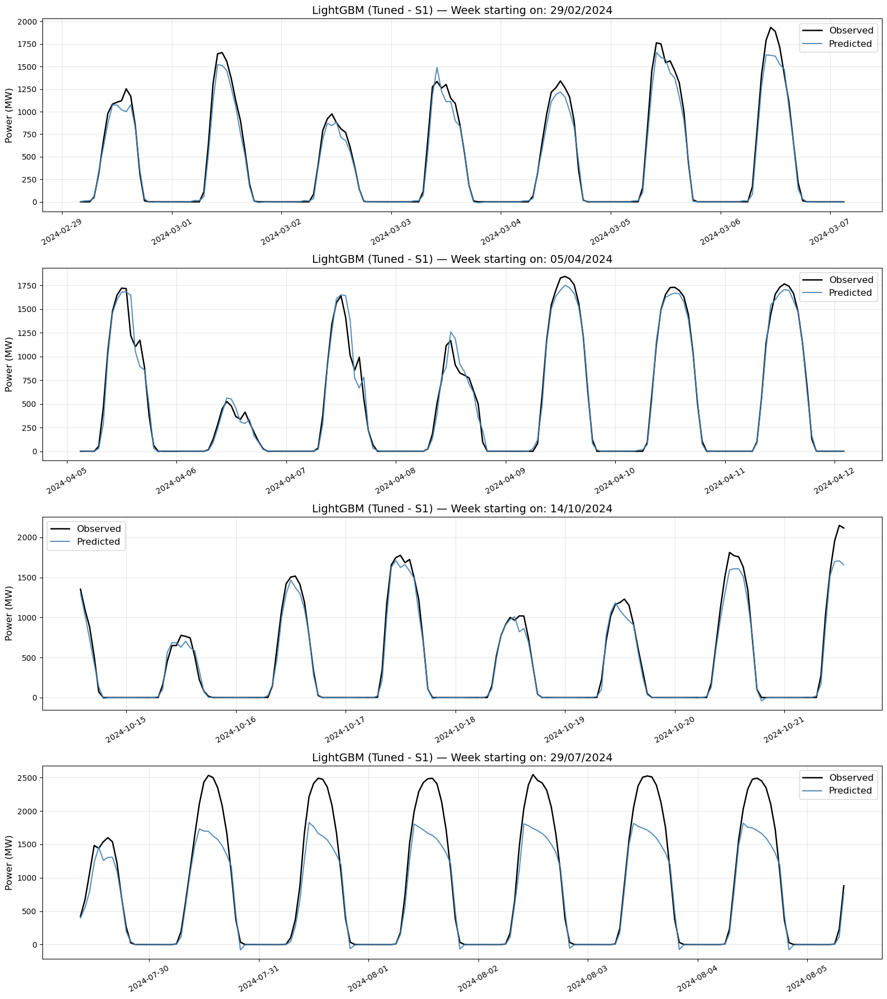

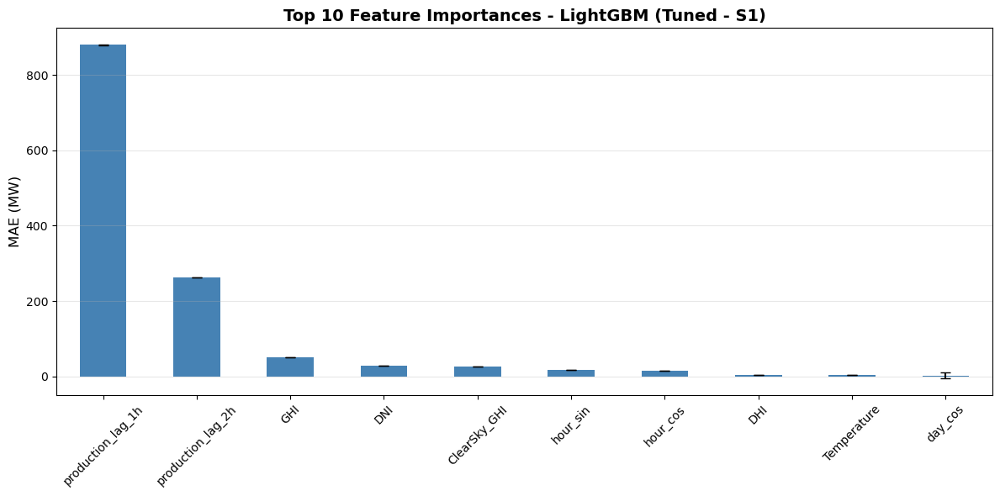

production_lag_1h    879.283106
production_lag_2h    262.326888
GHI                   51.677144
DNI                   28.657719
ClearSky_GHI          25.806418
hour_sin              18.001265
hour_cos              15.347774
DHI                    5.126178
Temperature            3.271880
day_cos                2.635564
day_sin                1.622343
production_lag_3h      1.620880
dtype: float64

In [81]:
start_time = time.time()

automl_lgb = AutoML()
automl_lgb.fit(
    X_train=X_train,
    y_train=y_train_real,
    estimator_list=["lgbm"], 
    **automl_settings
)

tune_time_lgb = time.time() - start_time

print(f"\nTuning time (LightGBM): {tune_time_lgb:.1f} seconds")
print("Best configuration (auto-found):", automl_lgb.best_config)
print("Best validation MAE:", automl_lgb.best_loss)

# Final predictions
pred_mw_lgb = automl_lgb.predict(X_test)

# Evaluation and plots
metrics_lgb = evaluate_model(y_test_real, pred_mw_lgb, 'LightGBM (Tuned - S1)')
metrics_lgb['Time (s)'] = round(tune_time_lgb, 2)
results.append(metrics_lgb)

plot_sample_week(y_test_real, pred_mw_lgb, 'LightGBM (Tuned - S1)', n_samples=4)
tuned_model = automl_lgb.model.estimator
plot_permutation_importance(tuned_model, X_test, y_test_real, "LightGBM (Tuned - S1)")

## Scenario 2: Train on the normalized target and then convert it back to MW

### Decision Tree

In [84]:
start_time = time.time()
model_default = DecisionTreeRegressor(random_state=42)  
model_default.fit(X_train, y_train)
train_time_default = time.time() - start_time

pred_norm_default = model_default.predict(X_test)
pred_mw_default = pred_norm_default * capacity_test.values
metrics_default = evaluate_model(y_test_real, pred_mw_default, 'Decision Tree (Default - S2)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)


Decision Tree (Default - S2) (Test set)
   MAE  : 83.2 MW
   RMSE : 165.2 MW
   R²   : 0.9525
   MAPE : 27.4% (on 4,470 hours > 10 MW)


### Random Forest


Random Forest (Default - S2) (Test set)
   MAE  : 71.6 MW
   RMSE : 137.4 MW
   R²   : 0.9671
   MAPE : 25.8% (on 4,470 hours > 10 MW)


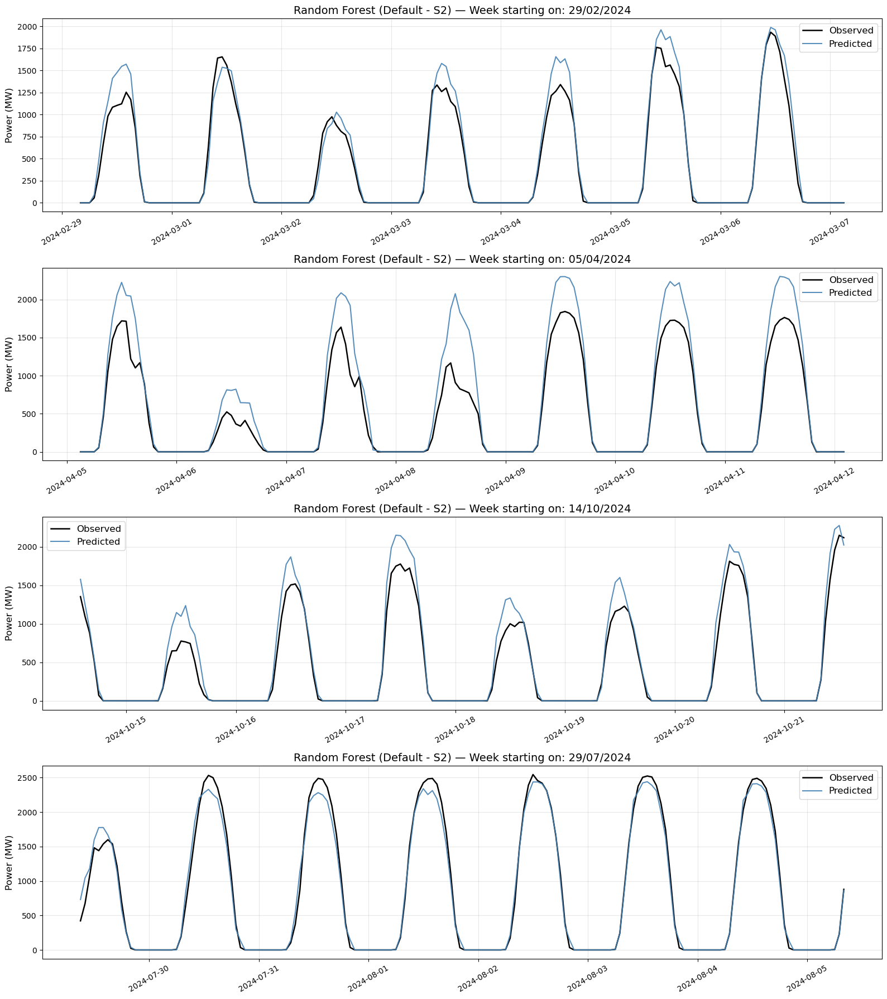

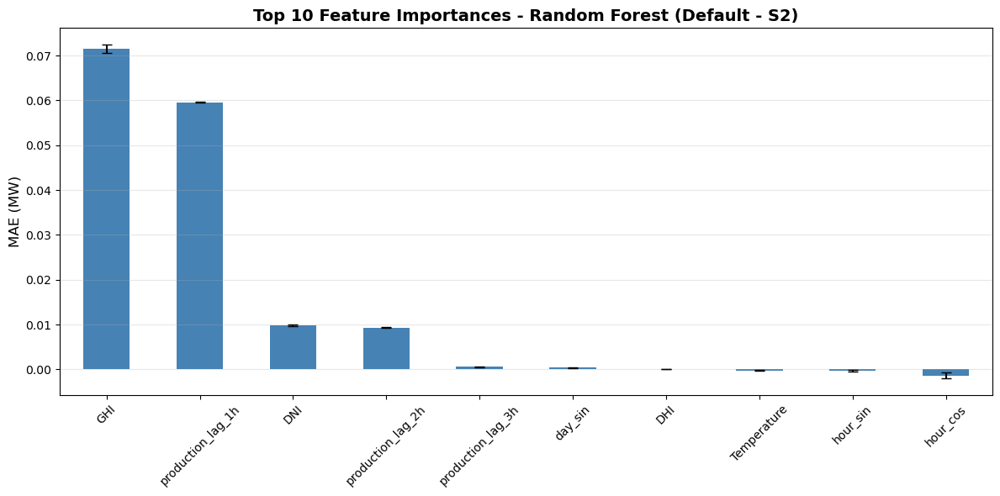

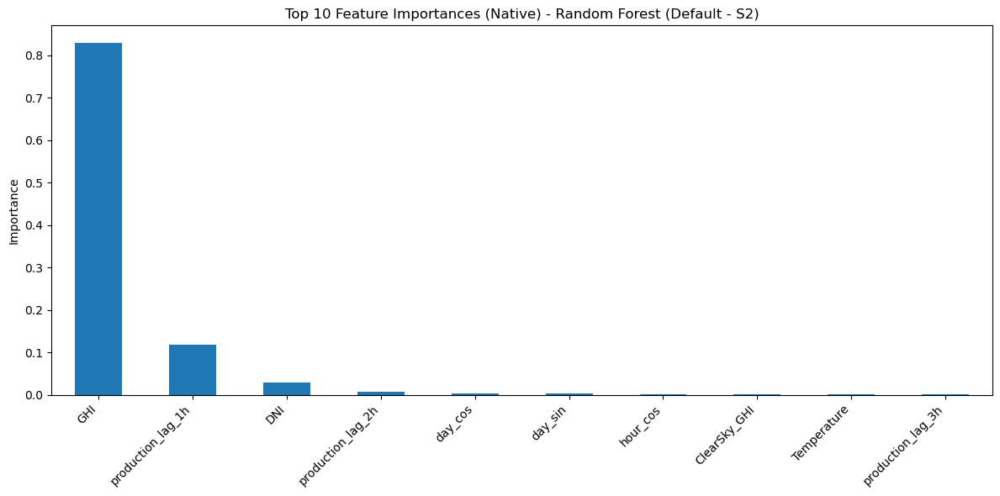

In [87]:
start_time = time.time()
model_default = RandomForestRegressor(
    random_state=42,
    n_jobs=-1
) 
model_default.fit(X_train, y_train)
train_time_default = time.time() - start_time

pred_norm_default = model_default.predict(X_test)
pred_mw_default = pred_norm_default * capacity_test.values
metrics_default = evaluate_model(y_test_real, pred_mw_default, 'Random Forest (Default - S2)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)

plot_sample_week(y_test_real, pred_mw_default, 'Random Forest (Default - S2)', n_samples=4)
plot_permutation_importance(model_default, X_test, y_test_real, "Random Forest (Default - S2)")

# Native Feature importance 
importances = pd.Series(model_default.feature_importances_,index=X_train.columns).sort_values(ascending=False)

plt.figure(figsize=(12, 6))
importances.head(10).plot(kind="bar")  
plt.title("Top 10 Feature Importances (Native) - Random Forest (Default - S2)")
plt.ylabel("Importance")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

[flaml.automl.logger: 06-30 02:41:54] {2133} INFO - task = regression
[flaml.automl.logger: 06-30 02:41:54] {2144} INFO - Evaluation method: cv
[flaml.automl.logger: 06-30 02:41:54] {2243} INFO - Minimizing error metric: mae
[flaml.automl.logger: 06-30 02:41:54] {2360} INFO - List of ML learners in AutoML Run: ['rf']
[flaml.automl.logger: 06-30 02:41:54] {2665} INFO - iteration 0, current learner rf
[flaml.automl.logger: 06-30 02:41:55] {2800} INFO - Estimated sufficient time budget=7147s. Estimated necessary time budget=7s.
[flaml.automl.logger: 06-30 02:41:55] {2851} INFO -  at 0.8s,	estimator rf's best error=0.0509,	best estimator rf's best error=0.0509
[flaml.automl.logger: 06-30 02:41:55] {2665} INFO - iteration 1, current learner rf
[flaml.automl.logger: 06-30 02:41:56] {2851} INFO -  at 1.7s,	estimator rf's best error=0.0451,	best estimator rf's best error=0.0451
[flaml.automl.logger: 06-30 02:41:56] {2665} INFO - iteration 2, current learner rf
[flaml.automl.logger: 06-30 02:41

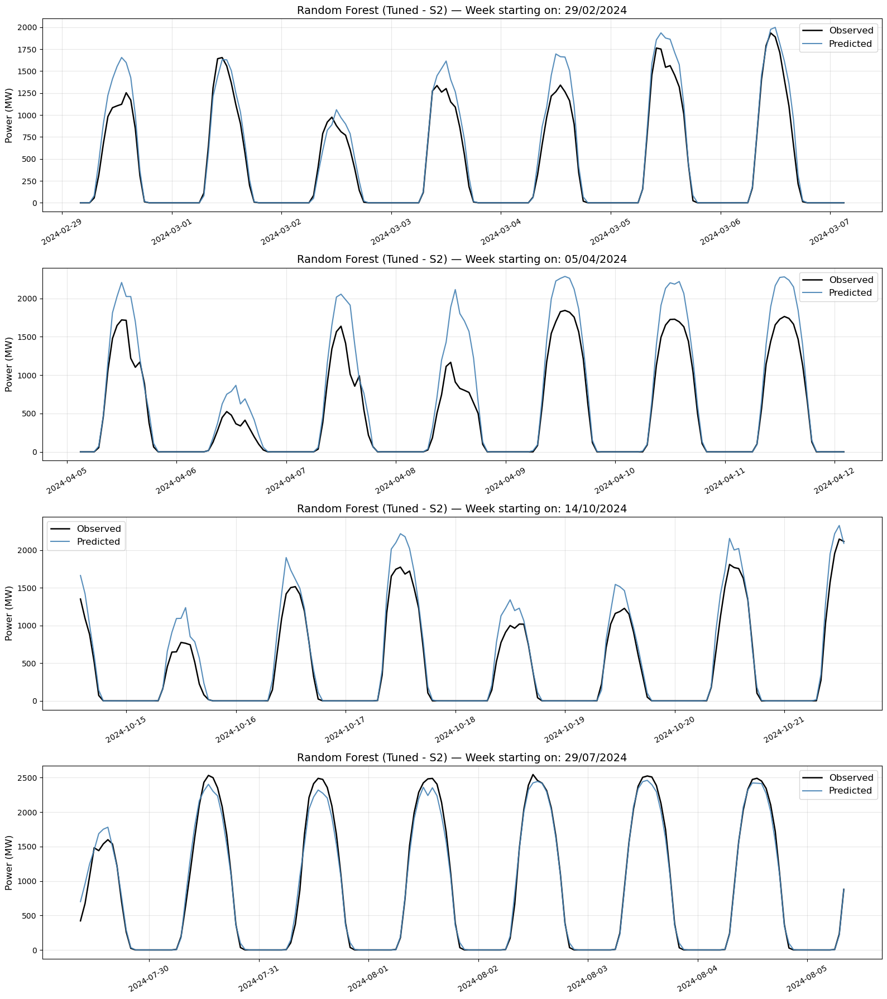

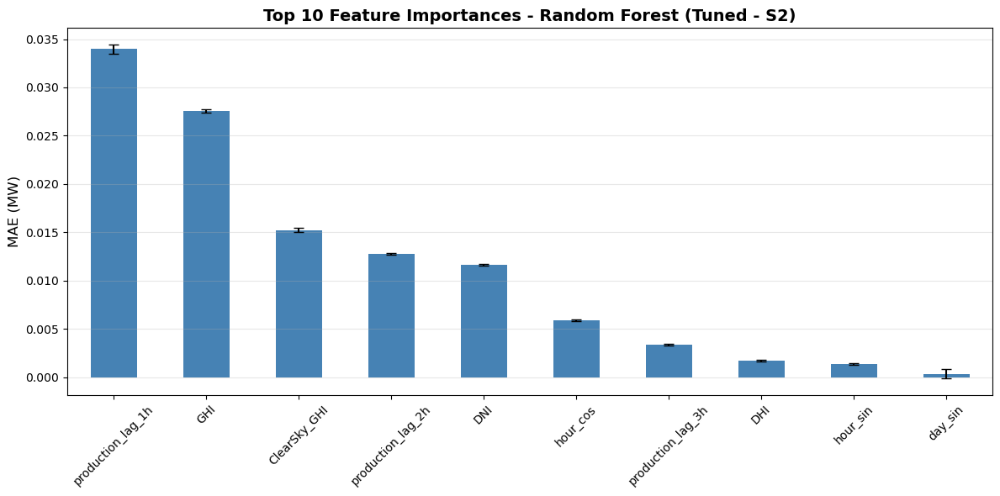

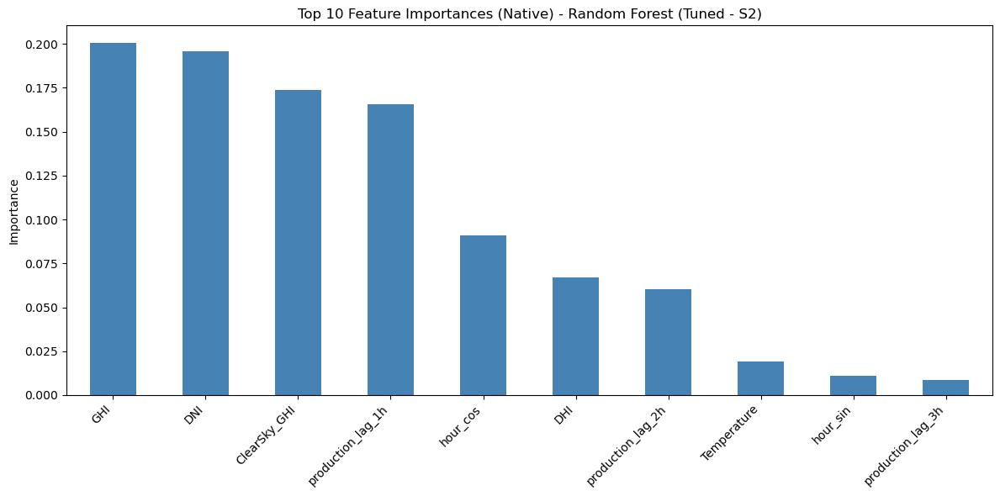

In [88]:
start_time = time.time()

automl_rf = AutoML()
automl_rf.fit(
    X_train=X_train,
    y_train=y_train,
    estimator_list=["rf"], 
    **automl_settings
)

tune_time_rf = time.time() - start_time

print(f"\nTuning time (Random Forest): {tune_time_rf:.1f} seconds")
print("Best configuration (auto-found):", automl_rf.best_config)
print("Best validation MAE:", automl_rf.best_loss)

# Final predictions
pred_norm_rf = automl_rf.predict(X_test)
pred_mw_rf = pred_norm_rf * capacity_test.values

# Evaluation and plots
metrics_rf = evaluate_model(y_test_real, pred_mw_rf, 'Random Forest (Tuned - S2)')
metrics_rf['Time (s)'] = round(tune_time_rf, 2)
results.append(metrics_rf)

plot_sample_week(y_test_real, pred_mw_rf, 'Random Forest (Tuned - S2)', n_samples=4)

tuned_model = automl_rf.model.estimator

plot_permutation_importance(tuned_model, X_test, y_test_real, "Random Forest (Tuned - S2)")

# Native feature importance
importances = pd.Series(tuned_model.feature_importances_, index=X_train.columns).sort_values(ascending=False)
plt.figure(figsize=(12, 6))
importances.head(10).plot.bar(color='steelblue')
plt.title('Top 10 Feature Importances (Native) - Random Forest (Tuned - S2)')
plt.ylabel('Importance')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### XGBoost


XGBoost (Default - S2) (Test set)
   MAE  : 80.2 MW
   RMSE : 148.9 MW
   R²   : 0.9614
   MAPE : 25.8% (on 4,470 hours > 10 MW)


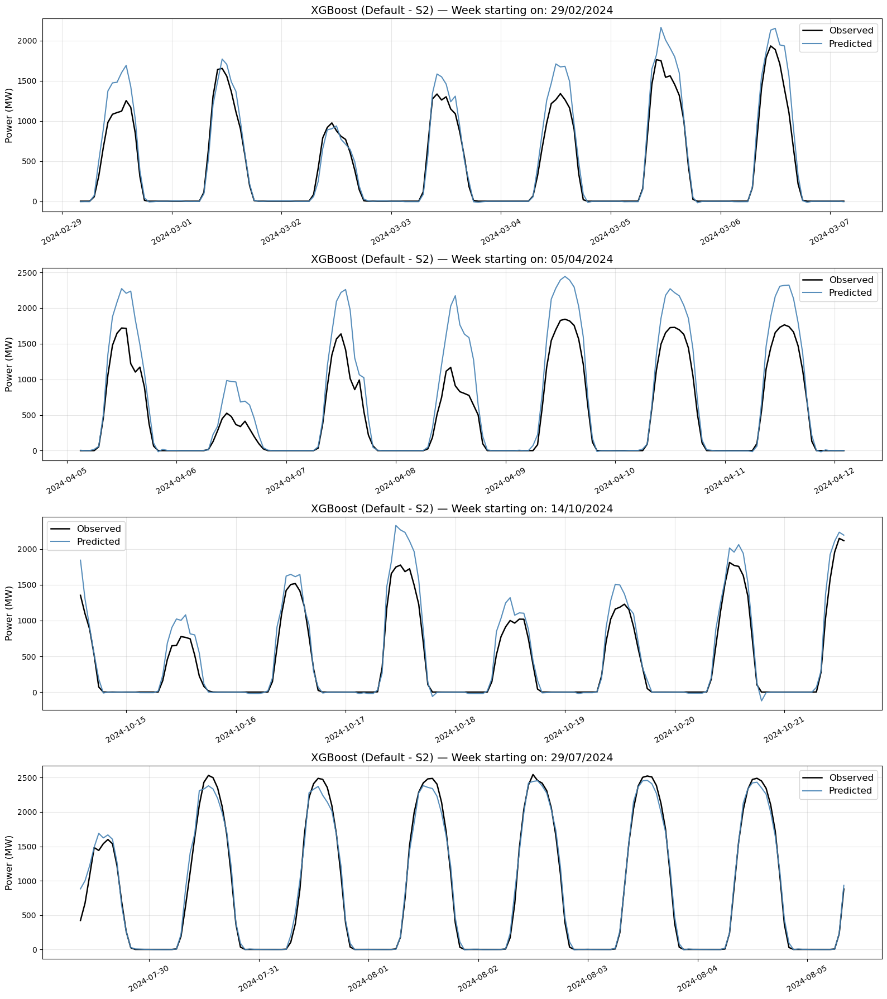

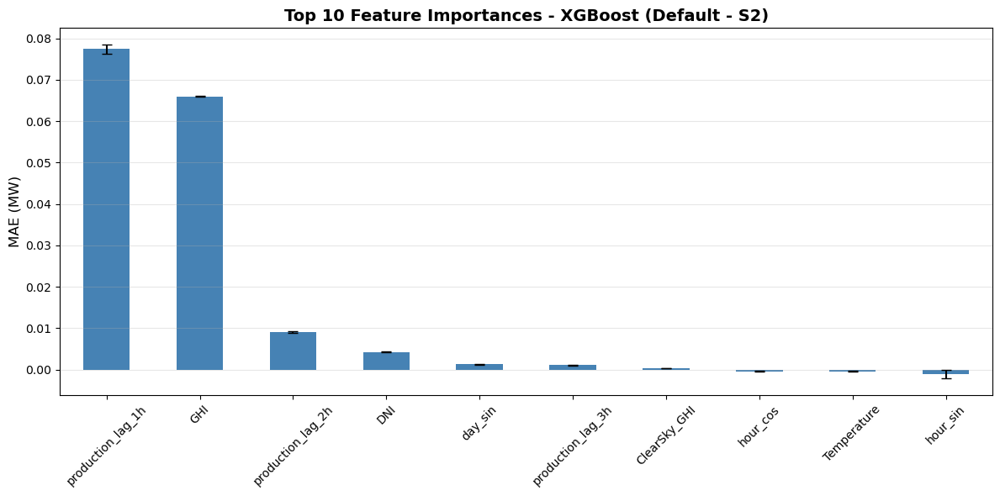

production_lag_1h    0.077397
GHI                  0.065975
production_lag_2h    0.009119
DNI                  0.004233
day_sin              0.001281
production_lag_3h    0.001054
ClearSky_GHI         0.000343
hour_cos            -0.000433
Temperature         -0.000454
hour_sin            -0.001092
day_cos             -0.001399
DHI                 -0.003619
dtype: float64

In [91]:
start_time = time.time()
model_default = xgb.XGBRegressor(random_state=42, n_jobs=-1) 
model_default.fit(X_train, y_train)
train_time_default = time.time() - start_time

pred_norm_default = model_default.predict(X_test)
pred_mw_default = pred_norm_default * capacity_test.values
metrics_default = evaluate_model(y_test_real, pred_mw_default, 'XGBoost (Default - S2)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)

plot_sample_week(y_test_real, pred_mw_default, 'XGBoost (Default - S2)', n_samples=4)
plot_permutation_importance(model_default, X_test, y_test_real, "XGBoost (Default - S2)")

[flaml.automl.logger: 06-30 02:52:09] {2133} INFO - task = regression
[flaml.automl.logger: 06-30 02:52:09] {2144} INFO - Evaluation method: cv
[flaml.automl.logger: 06-30 02:52:09] {2243} INFO - Minimizing error metric: mae
[flaml.automl.logger: 06-30 02:52:09] {2360} INFO - List of ML learners in AutoML Run: ['xgboost']
[flaml.automl.logger: 06-30 02:52:09] {2665} INFO - iteration 0, current learner xgboost
[flaml.automl.logger: 06-30 02:52:09] {2800} INFO - Estimated sufficient time budget=1382s. Estimated necessary time budget=1s.
[flaml.automl.logger: 06-30 02:52:09] {2851} INFO -  at 0.2s,	estimator xgboost's best error=0.1411,	best estimator xgboost's best error=0.1411
[flaml.automl.logger: 06-30 02:52:09] {2665} INFO - iteration 1, current learner xgboost
[flaml.automl.logger: 06-30 02:52:09] {2851} INFO -  at 0.4s,	estimator xgboost's best error=0.1411,	best estimator xgboost's best error=0.1411
[flaml.automl.logger: 06-30 02:52:09] {2665} INFO - iteration 2, current learner x

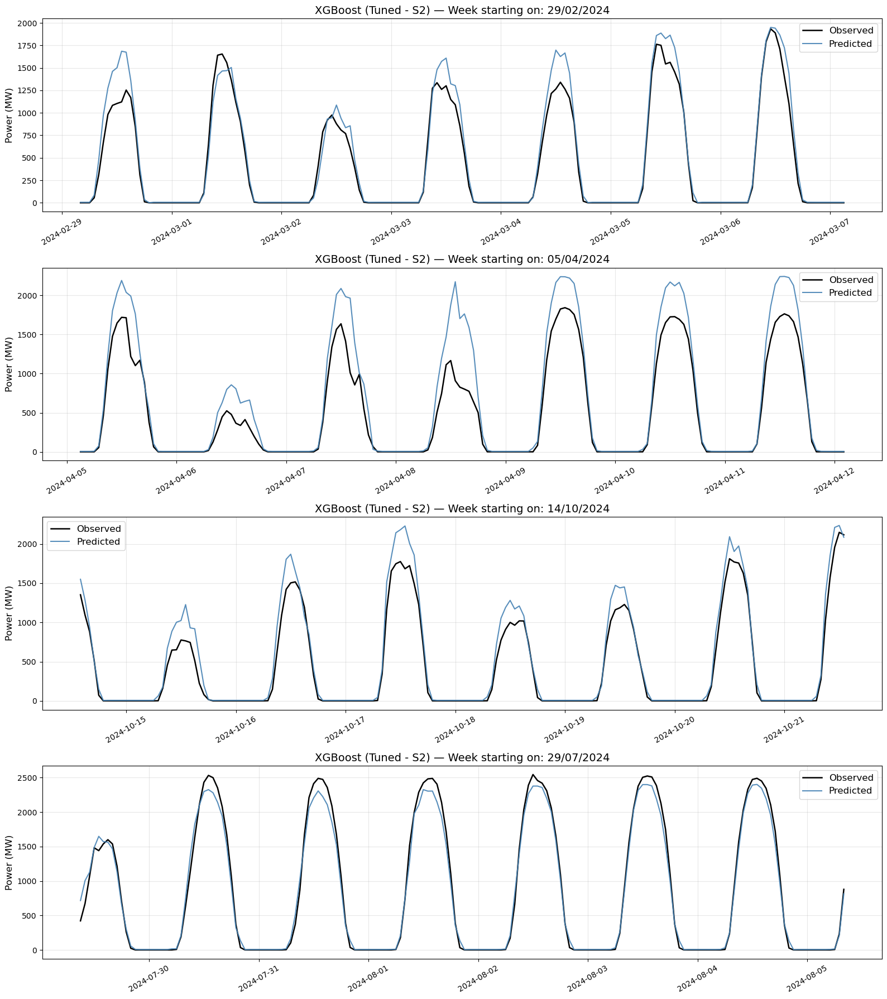

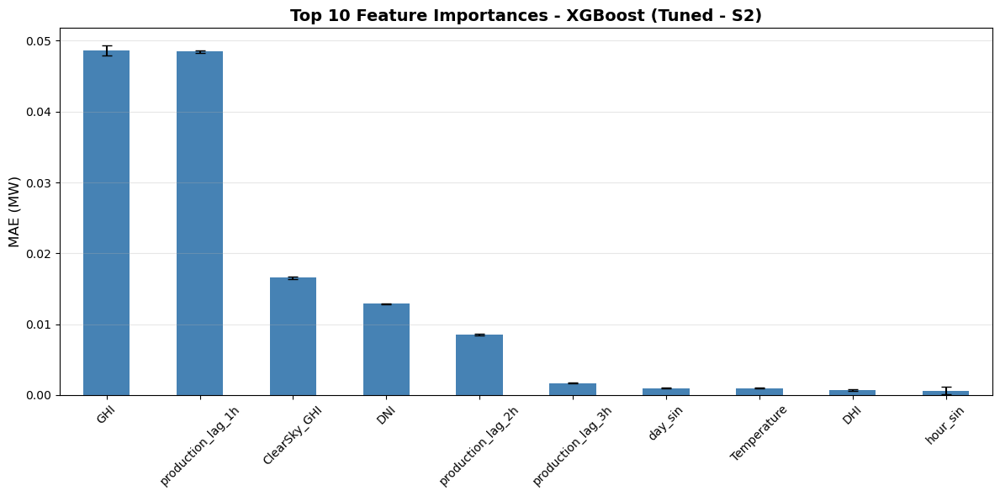

GHI                  0.048607
production_lag_1h    0.048476
ClearSky_GHI         0.016577
DNI                  0.012907
production_lag_2h    0.008534
production_lag_3h    0.001712
day_sin              0.000984
Temperature          0.000966
DHI                  0.000738
hour_sin             0.000644
day_cos             -0.001155
hour_cos            -0.002473
dtype: float64

In [92]:
start_time = time.time()

automl_xgb = AutoML()
automl_xgb.fit(
    X_train=X_train,
    y_train=y_train,
    estimator_list=["xgboost"],  
    **automl_settings
)

tune_time_xgb = time.time() - start_time

print(f"\nTuning time (XGBoost): {tune_time_xgb:.1f} seconds")
print("Best configuration (auto-found):", automl_xgb.best_config)
print("Best validation MAE:", automl_xgb.best_loss)

# Final predictions
pred_norm_xgb = automl_xgb.predict(X_test)
pred_mw_xgb = pred_norm_xgb * capacity_test.values

# Evaluation and plots
metrics_xgb = evaluate_model(y_test_real, pred_mw_xgb, 'XGBoost (Tuned - S2)')
metrics_xgb['Time (s)'] = round(tune_time_xgb, 2)
results.append(metrics_xgb)

plot_sample_week(y_test_real, pred_mw_xgb, 'XGBoost (Tuned - S2)', n_samples=4)
tuned_model = automl_xgb.model.estimator
plot_permutation_importance(tuned_model, X_test, y_test_real, "XGBoost (Tuned - S2)")

### LightGBM


LightGBM (Default - S2) (Test set)
   MAE  : 75.0 MW
   RMSE : 138.8 MW
   R²   : 0.9665
   MAPE : 29.0% (on 4,470 hours > 10 MW)


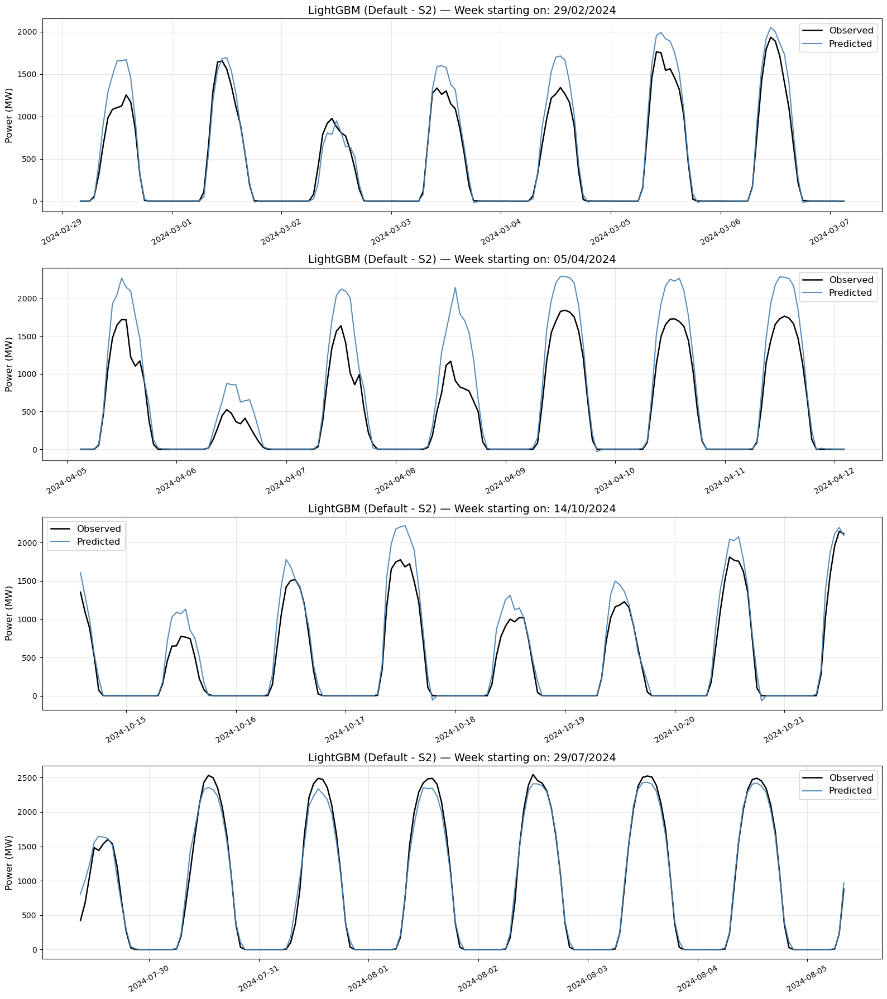

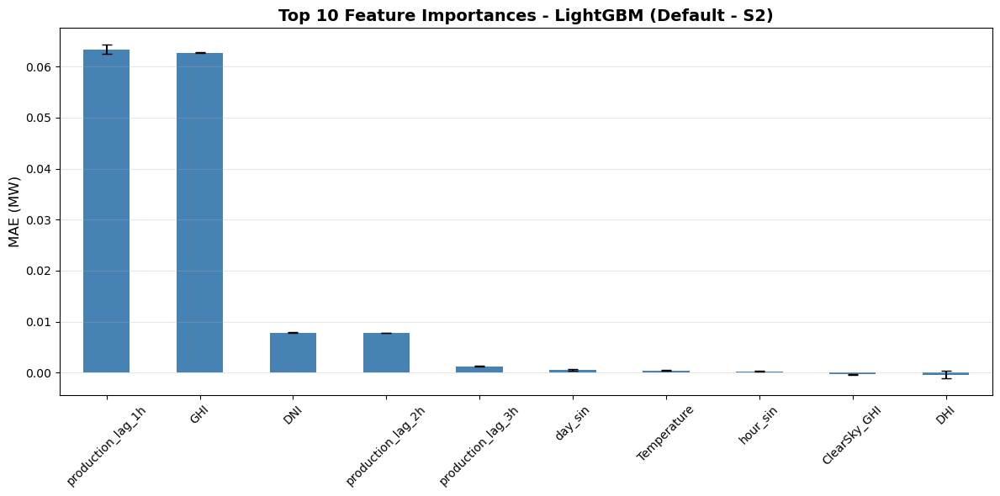

production_lag_1h    0.063345
GHI                  0.062689
DNI                  0.007872
production_lag_2h    0.007754
production_lag_3h    0.001248
day_sin              0.000548
Temperature          0.000445
hour_sin             0.000270
ClearSky_GHI        -0.000291
DHI                 -0.000380
hour_cos            -0.000875
day_cos             -0.001456
dtype: float64

In [95]:
start_time = time.time()
model_default = lgb.LGBMRegressor(random_state=42, n_jobs=-1, force_row_wise=True)
model_default.fit(X_train, y_train)
train_time_default = time.time() - start_time

pred_norm_default = model_default.predict(X_test)
pred_mw_default = pred_norm_default * capacity_test.values
metrics_default = evaluate_model(y_test_real, pred_mw_default, 'LightGBM (Default - S2)')
metrics_default['Time (s)'] = round(train_time_default, 2)
results.append(metrics_default)

plot_sample_week(y_test_real, pred_mw_default, 'LightGBM (Default - S2)', n_samples=4)
plot_permutation_importance(model_default, X_test, y_test_real, "LightGBM (Default - S2)")

[flaml.automl.logger: 06-30 03:02:19] {2133} INFO - task = regression
[flaml.automl.logger: 06-30 03:02:19] {2144} INFO - Evaluation method: cv
[flaml.automl.logger: 06-30 03:02:19] {2243} INFO - Minimizing error metric: mae
[flaml.automl.logger: 06-30 03:02:19] {2360} INFO - List of ML learners in AutoML Run: ['lgbm']
[flaml.automl.logger: 06-30 03:02:19] {2665} INFO - iteration 0, current learner lgbm
[flaml.automl.logger: 06-30 03:02:19] {2800} INFO - Estimated sufficient time budget=1995s. Estimated necessary time budget=2s.
[flaml.automl.logger: 06-30 03:02:19] {2851} INFO -  at 0.3s,	estimator lgbm's best error=0.1411,	best estimator lgbm's best error=0.1411
[flaml.automl.logger: 06-30 03:02:19] {2665} INFO - iteration 1, current learner lgbm
[flaml.automl.logger: 06-30 03:02:20] {2851} INFO -  at 0.5s,	estimator lgbm's best error=0.1411,	best estimator lgbm's best error=0.1411
[flaml.automl.logger: 06-30 03:02:20] {2665} INFO - iteration 2, current learner lgbm
[flaml.automl.log

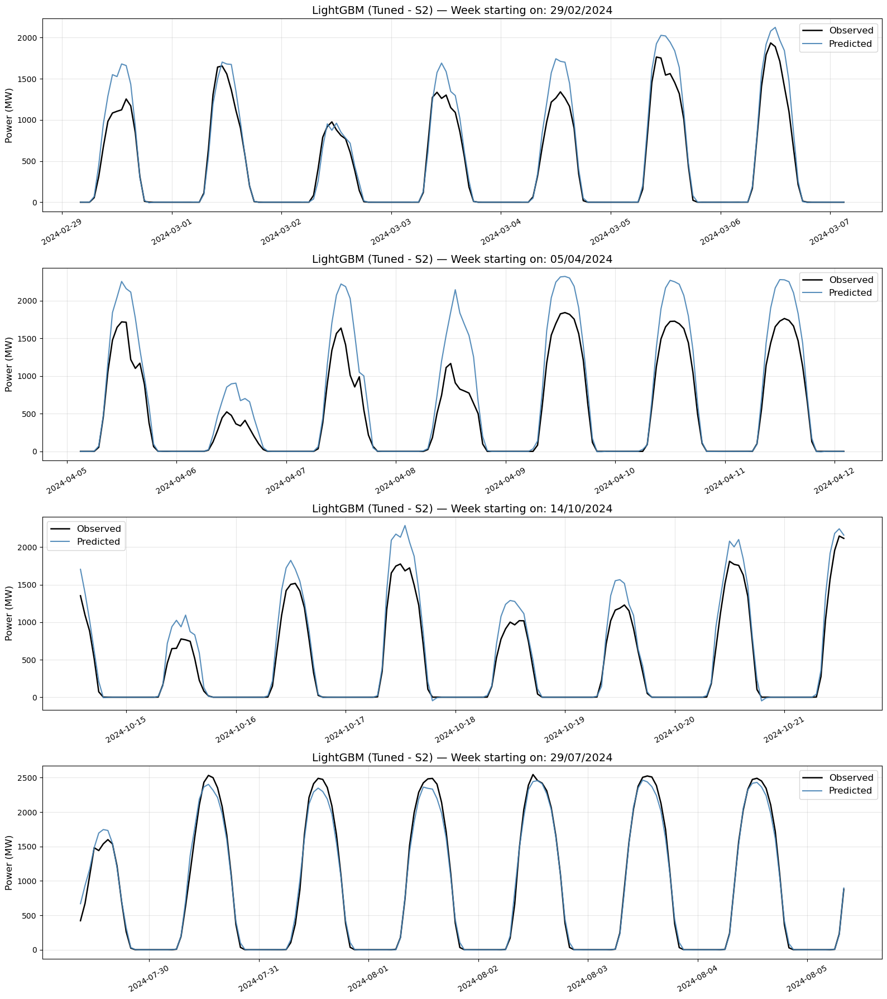

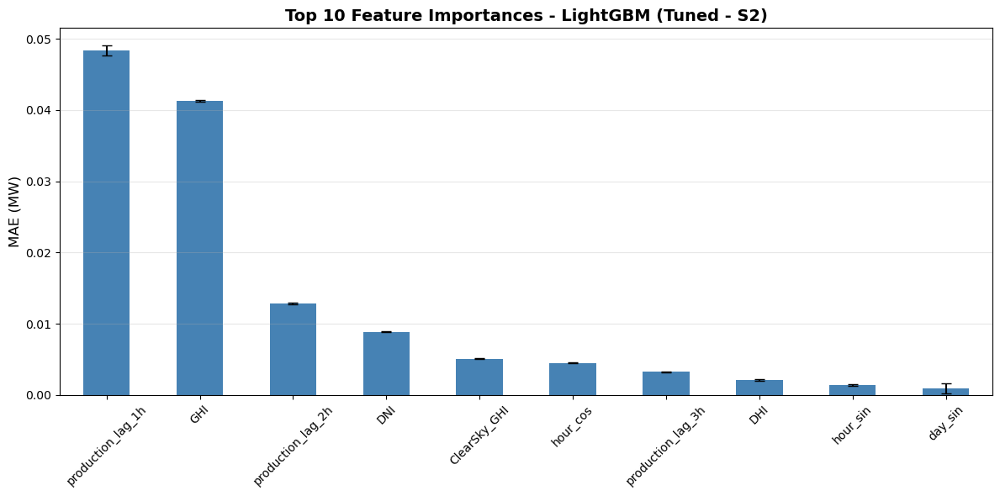

production_lag_1h    0.048348
GHI                  0.041266
production_lag_2h    0.012858
DNI                  0.008890
ClearSky_GHI         0.005102
hour_cos             0.004528
production_lag_3h    0.003273
DHI                  0.002081
hour_sin             0.001433
day_sin              0.000936
Temperature          0.000027
day_cos             -0.000922
dtype: float64

In [96]:
start_time = time.time()

automl_lgb = AutoML()
automl_lgb.fit(
    X_train=X_train,
    y_train=y_train,
    estimator_list=["lgbm"], 
    **automl_settings
)

tune_time_lgb = time.time() - start_time

print(f"\nTuning time (LightGBM): {tune_time_lgb:.1f} seconds")
print("Best configuration (auto-found):", automl_lgb.best_config)
print("Best validation MAE:", automl_lgb.best_loss)

# Final predictions
pred_norm_lgb = automl_lgb.predict(X_test)
pred_mw_lgb = pred_norm_lgb * capacity_test.values

# Evaluation and plots
metrics_lgb = evaluate_model(y_test_real, pred_mw_lgb, 'LightGBM (Tuned - S2)')
metrics_lgb['Time (s)'] = round(tune_time_lgb, 2)
results.append(metrics_lgb)

plot_sample_week(y_test_real, pred_mw_lgb, 'LightGBM (Tuned - S2)', n_samples=4)
tuned_model = automl_lgb.model.estimator
plot_permutation_importance(tuned_model, X_test, y_test_real, "LightGBM (Tuned - S2)")

In [98]:
results_df = pd.DataFrame(results)
results_df = results_df[['Model', 'MAE (MW)', 'RMSE (MW)', 'R2', 'MAPE (%)', 'Time (s)']]
results_df = results_df.sort_values('MAE (MW)') 

print("\n" + "="*80)
print("Performance (Test Set)")
print("="*80)

print(tabulate(
    results_df.round(2), 
    headers='keys', 
    tablefmt='fancy_grid', 
    showindex=False,
    colalign=('left', 'center', 'center', 'center', 'center', 'center')
))


Performance (Test Set)
╒══════════════════════════════╤════════════╤═════════════╤══════╤════════════╤════════════╕
│ Model                        │  MAE (MW)  │  RMSE (MW)  │  R2  │  MAPE (%)  │  Time (s)  │
╞══════════════════════════════╪════════════╪═════════════╪══════╪════════════╪════════════╡
│ Random Forest (Tuned - S2)   │    71.1    │    135.9    │ 0.97 │    27.4    │   599.18   │
├──────────────────────────────┼────────────┼─────────────┼──────┼────────────┼────────────┤
│ Random Forest (Default - S2) │    71.6    │    137.4    │ 0.97 │    25.8    │    5.42    │
├──────────────────────────────┼────────────┼─────────────┼──────┼────────────┼────────────┤
│ XGBoost (Tuned - S2)         │    72.2    │    131.4    │ 0.97 │     29     │   594.44   │
├──────────────────────────────┼────────────┼─────────────┼──────┼────────────┼────────────┤
│ LightGBM (Default - S2)      │     75     │    138.8    │ 0.97 │     29     │    0.28    │
├──────────────────────────────┼────────────┼─

In [99]:
persistence_mae = metrics_persistence['MAE (MW)']
best_model_mae = min([r['MAE (MW)'] for r in results if 'Tuned' in r['Model']])

improvement = (persistence_mae - best_model_mae) / persistence_mae * 100

print(f"\nImprovement on Persistence: {improvement:.1f}%")


Improvement on Persistence: 51.4%


In [100]:
results_df = pd.DataFrame(results)

persistence_mae = metrics_persistence['MAE (MW)']

results_df['Improvement over Persistence (%)'] = (
    (persistence_mae - results_df['MAE (MW)']) / persistence_mae * 100
)


results_df = results_df[
    ['Model', 'MAE (MW)', 'RMSE (MW)', 'R2', 'MAPE (%)', 'Time (s)', 'Improvement over Persistence (%)']
].sort_values('MAE (MW)')

print("\n" + "="*80)
print("Performance (Test Set)")
print("="*80)

print(tabulate(
    results_df.round(2),
    headers='keys',
    tablefmt='fancy_grid',
    showindex=False,
    colalign=('left', 'center', 'center', 'center', 'center', 'center', 'center')
))


Performance (Test Set)
╒══════════════════════════════╤════════════╤═════════════╤══════╤════════════╤════════════╤════════════════════════════════════╕
│ Model                        │  MAE (MW)  │  RMSE (MW)  │  R2  │  MAPE (%)  │  Time (s)  │  Improvement over Persistence (%)  │
╞══════════════════════════════╪════════════╪═════════════╪══════╪════════════╪════════════╪════════════════════════════════════╡
│ Random Forest (Tuned - S2)   │    71.1    │    135.9    │ 0.97 │    27.4    │   599.18   │                51.4                │
├──────────────────────────────┼────────────┼─────────────┼──────┼────────────┼────────────┼────────────────────────────────────┤
│ Random Forest (Default - S2) │    71.6    │    137.4    │ 0.97 │    25.8    │    5.42    │               51.06                │
├──────────────────────────────┼────────────┼─────────────┼──────┼────────────┼────────────┼────────────────────────────────────┤
│ XGBoost (Tuned - S2)         │    72.2    │    131.4    │ 0.97 │

In [101]:
print(f"Total time: {time.time() - notebook_start:.2f} seconds")


Total time: 6367.79 seconds
